# Install and Import Libraries

In [1]:
pip install catboost

In [2]:
import pandas as pd
import catboost
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline

from sklearn import preprocessing
from sklearn.impute import SimpleImputer
import geopandas as gpd
import copy

# Classifier Libraries
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
import lightgbm
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
import collections

# Other Libraries
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from sklearn.model_selection import cross_val_score
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, f1_score, recall_score, precision_score, classification_report
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import StratifiedShuffleSplit
from imblearn import under_sampling, over_sampling

# Load Dataset

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# Read CSV files
df = pd.read_csv('/content/drive/MyDrive/Italy.csv')

In [5]:
# Show DataFrame
df.head(1)

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condominium Expenses,Bail,Year Of Construction,Condition,Air Conditioner,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Days Difference of Availability,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating
0,1800.0,3.0,60.0,1,"Affitto, libero","3 (2 camere da letto, 1 altro), 1 bagno, cucin...",10.0,1,Milano,Centrale,https://www.immobiliare.it/annunci/101614827/,120.0,NaN,1960.0,Excellent/renovated,1.0,NaN,0.0,2023-07-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1,0,1,0,1,0,0,0,0,0,0,0,1.0,E


# About Dataset

The Italy House Prices dataset by Tommaso Ramella, available at https://www.kaggle.com/datasets/tommasoramella/italy-house-prices, is licensed under a Creative Commons Attribution 4.0 International License (CC BY 4.0) (https://github.com/openpolis/geojson-italy/blob/master/LICENSE).

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62941 entries, 0 to 62940
Data columns (total 58 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Price                            62941 non-null  float64
 1   Rooms                            58425 non-null  float64
 2   M2                               62364 non-null  float64
 3   Bathrooms                        61328 non-null  object 
 4   Contract                         62941 non-null  object 
 5   Locals                           62225 non-null  object 
 6   Total Building Plans             59674 non-null  float64
 7   Parking Spaces                   62941 non-null  int64  
 8   City                             62941 non-null  object 
 9   Quarter                          59429 non-null  object 
 10  Href                             62941 non-null  object 
 11  Condominium Expenses             48589 non-null  float64
 12  Bail              

## Columns information
1. Price
2. Rooms: Number of rooms
3. M2: Surface
4. Bathrooms: Number of bathrooms
5. Contract: Rent or sale
6. Locals: Room totals and specifications
7. Parking Spaces: Available (1) or not available (0)
8. City: The place where the building was built
9. Quarter: Neighborhood
10. Href: Link (source information)
11. Condominium Expenses: Cost per month condominium
12. Bail: Deposit fees
13. Year Of Construction: Construction Year
14. Condition: State of the building
15. Air Conditioner: System to cool or warm the room temperature
16. Region: Certain areas have the same characteristics
17. Total Building Plans: Total floors building
18. Sea View: The building has a sea view
19. Datetime: Reference and announcement date
20. Villa: Villa type
21. Palazzo: Building type
22. Casa: Home type
23. Casale: Farmhouse type
24. Cascina: Farmhouse type
25. Appartamento: Apartment type
26. Chalet: Chalet type
27. Terratetto: Townhouse type
28. Attico: Attic type
29. Loft: Lofts type
30. Mansarda: Attic type
31. Open Space: Open Space type
32. Ufficio: Office type
33. Baita: Cabin type
34. Baglio: Beam type
35. Masseria: Masseria type
36. Trullo: Trulli type
37. Rifugio: Refuge type
38. Soffitta: Ceiling type
39. Negozio: Shop type
40. Residence: Residence type
41. Studio: Studio type
42. Maso: Farm type
43. Dammuso: Dammuso type
44. Days Difference of Availability
45. Arredato: Furnished
46. Balcone: Balcony
47. Impianto tv: TV system
48. Esposizione esterna: External exposure
49. Fibra ottica: Optic fiber
50. Cancello elettrico: Electric gate
51. Cantina: Cellar
52. Giardino comune: Common garden
53. Giardino privato: Private garden
54. Impianto allarme: Alarm system
55. Portiere: Doorman
56. Piscina: Pool
57. Centralized Warming: Heating availability
58. Energy Rating: Energy efficiency

# Simple Data Cleaning

In [7]:
df['Region'].unique()

array([nan, 'lombardia', 'piemonte', 'emilia-romagna', 'liguria',
       'trentino-alto-adige', 'calabria', 'veneto', 'toscana', 'sicilia',
       'umbria', 'lazio', 'puglia', 'abruzzo', 'molise', 'basilicata',
       'marche', 'campania', 'sardegna', 'valle-d-aosta', 'Liguria'],
      dtype=object)

In [8]:
df['Region'] = df['Region'].str.upper()

In [9]:
df['Region'].unique()

array([nan, 'LOMBARDIA', 'PIEMONTE', 'EMILIA-ROMAGNA', 'LIGURIA',
       'TRENTINO-ALTO-ADIGE', 'CALABRIA', 'VENETO', 'TOSCANA', 'SICILIA',
       'UMBRIA', 'LAZIO', 'PUGLIA', 'ABRUZZO', 'MOLISE', 'BASILICATA',
       'MARCHE', 'CAMPANIA', 'SARDEGNA', 'VALLE-D-AOSTA'], dtype=object)

**For Baseline Model**

In [10]:
# Make copy for baseline model
df_baseline = copy.deepcopy(df)

In [11]:
# Only numerical features for baseline
train = df_baseline.drop(['Bathrooms', 'Contract', 'Locals', 'City', 'Quarter', 'Href', 'Condition', 'Region', 'Datetime', 'Energy Rating'], axis=1)
data_temp = train.select_dtypes(include=np.number)

In [12]:
# Drop NA
data_temp = data_temp.dropna()

In [13]:
# Split data
X = data_temp.drop('Price', axis = 1)
y = data_temp.Price

X_train_base, X_test_base, y_train_base, y_test_base = train_test_split(X, y, test_size=0.20, random_state=42)

# Exploratory Data Analysis

In [14]:
# Data based on categorical and numerical for EDA
categoricals = df.select_dtypes(include='object')
numericals = df.select_dtypes(exclude=['object'])

In [15]:
# Make copy for EDA
df_EDA = copy.deepcopy(df)

## Statistical Descriptive

In [16]:
# Statistical Description for Object Type Features
df_EDA.select_dtypes(include='object').describe()

,Bathrooms,Contract,Locals,City,Quarter,Href,Condition,Region,Datetime,Energy Rating
count,61328,62941,62225,62941,59429,62941,62941,62929,62941,50542
unique,18,25,1097,3518,13544,62941,5,19,874,8
top,1,Affitto,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",Milano,Centro Storico,https://www.immobiliare.it/annunci/101614827/,Excellent/renovated,LAZIO,2023-06-05,G
freq,43602,24549,5520,6642,2137,1,34844,9325,2225,22500


In [17]:
# Statistical Description for Numerical Features
df_EDA.describe()

,Price,Rooms,M2,Total Building Plans,Parking Spaces,Condominium Expenses,Bail,Year Of Construction,Air Conditioner,Sea View,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Days Difference of Availability,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming
count,6.294100e+04,58425.000000,6.236400e+04,59674.000000,62941.000000,4.858900e+04,2.551900e+04,34827.000000,30507.000000,62889.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.0,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.0,62941.000000,62941.000000,62941.000000,46765.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.000000,62941.0,62941.000000,62941.000000,53029.0
mean,2.138495e+03,2.702918,1.479024e+04,3.933438,0.376527,2.286764e+07,7.847395e+03,1956.215092,0.918281,0.025601,0.049173,0.007547,0.002383,0.001652,0.000111,0.889706,0.000270,0.012869,0.018144,0.003273,0.011932,0.0,0.000016,0.000191,0.000016,0.000095,0.000302,0.000016,0.000111,0.000016,0.0,0.000016,0.000016,0.000032,19.478755,0.759839,0.499849,0.595192,0.330595,0.346467,0.253396,0.186158,0.164233,0.123131,0.0,0.159912,0.022751,1.0
std,5.580060e+04,1.077341,3.581516e+06,21.216066,0.484519,5.040668e+09,7.036821e+05,77.006637,0.273941,0.157942,0.216231,0.086544,0.048760,0.040616,0.010545,0.313258,0.016432,0.112711,0.133473,0.057116,0.108580,0.0,0.003986,0.013807,0.003986,0.009763,0.017372,0.003986,0.010545,0.003986,0.0,0.003986,0.003986,0.005637,3378.882457,0.427185,0.500004,0.490859,0.470431,0.475848,0.434959,0.389238,0.370490,0.328590,0.0,0.366527,0.149111,0.0
min,1.000000e+00,1.000000,1.000000e+00,1.000000,0.000000,0.000000e+00,1.000000e+00,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,-249.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.0
25%,5.100000e+02,2.000000,5.000000e+01,2.000000,0.000000,0.000000e+00,8.500000e+02,1950.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.0
50%,7.500000e+02,3.000000,7.000000e+01,3.000000,0.000000,3.000000e+01,1.500000e+03,1970.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.0
75%,1.300000e+03,3.000000,1.000000e+02,5.000000,1.000000,1.000000e+02,2.850000e+03,1995.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.0
max,1.250000e+07,5.000000,8.942576e+08,4112.000000,1.000000,1.111110e+12,1.111111e+08,2984.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.0000

## KDE Plot

CPU times: user 58.4 s, sys: 3.99 s, total: 1min 2s
Wall time: 1min 23s


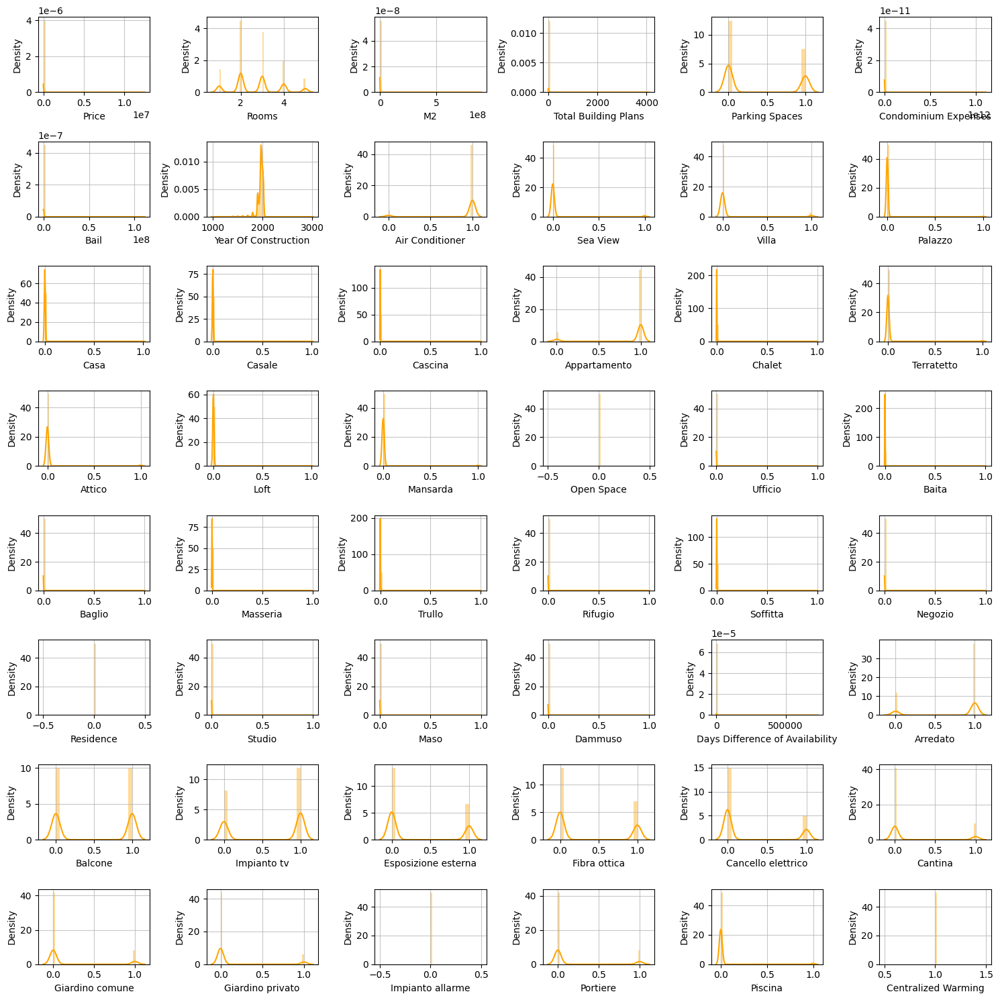

In [18]:
%%time
feats = numericals.columns

fig = plt.figure(figsize=(15, 15))
rows, cols = 8, 6

for i in range(0, len(feats)):
    ax = fig.add_subplot(rows, cols, i+1)
    ax.grid(alpha = 0.7, axis ='both')
    sns.distplot(x=df_EDA[feats[i]], color='orange')
    plt.xlabel(feats[i])
    plt.tight_layout()

## Scatterplot

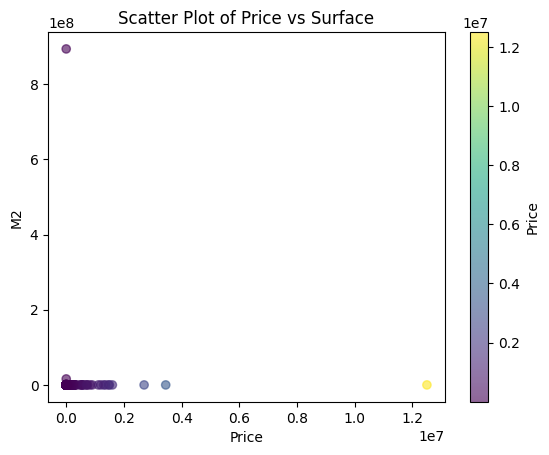

In [19]:
# Scatter plot with attractive labels and colors
plt.scatter(df_EDA['Price'], df_EDA['M2'], c=df['Price'], cmap='viridis', alpha=0.6)

# Assign labels to the x and y axes
plt.xlabel('Price')
plt.ylabel('M2')

# Display a colorbar as a color scale representation
plt.colorbar(label='Price')

# Display plot title
plt.title('Scatter Plot of Price vs Surface')

# Display plots
plt.show()

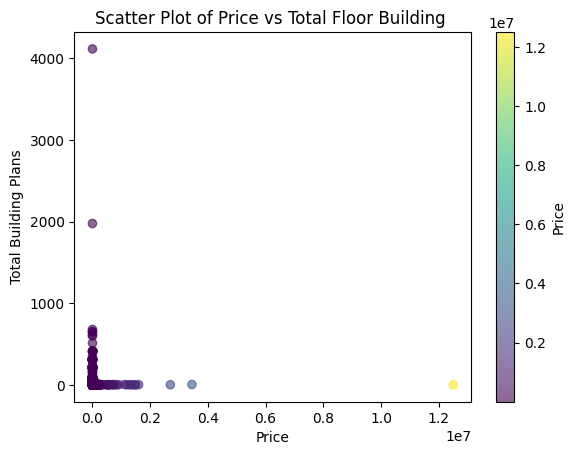

In [20]:
# Scatter plot with attractive labels and colors
plt.scatter(df_EDA['Price'], df_EDA['Total Building Plans'], c=df['Price'], cmap='viridis', alpha=0.6)

# Assign labels to the x and y axes
plt.xlabel('Price')
plt.ylabel('Total Building Plans')

# Display a colorbar as a color scale representation
plt.colorbar(label='Price')

# Display plot title
plt.title('Scatter Plot of Price vs Total Floor Building ')

# Display plots
plt.show()

## Correlation

In [21]:
# See the number of correlation
cor_matrix = df_EDA.corr()
cor_matrix.style.background_gradient(sns.light_palette('orange', as_cmap=True))

,Price,Rooms,M2,Total Building Plans,Parking Spaces,Condominium Expenses,Bail,Year Of Construction,Air Conditioner,Sea View,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Days Difference of Availability,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming
Price,1.000000,0.038304,-0.000103,-0.000589,0.012842,-0.000053,0.007403,0.002465,0.002755,0.005007,0.037044,0.030882,-0.000024,-0.000091,0.000006,-0.033702,0.000766,-0.000821,0.000901,-0.001089,-0.002643,nan,-0.000085,-0.000199,0.000240,-0.000278,0.000438,-0.000117,-0.000248,-0.000046,nan,-0.000121,-0.000117,0.000112,-0.000129,-0.015368,-0.000340,-0.000668,0.005720,-0.008652,0.008801,0.009403,-0.006383,0.021516,nan,0.000506,0.018133,nan
Rooms,0.038304,1.000000,0.183896,0.002411,0.183392,0.001347,-0.008957,-0.005066,-0.037668,0.054475,0.182933,0.016480,0.029098,0.025461,-0.001559,-0.145186,0.003427,0.054934,0.059346,-0.043266,-0.034819,nan,0.001141,0.006100,nan,-0.001559,0.020231,-0.002699,-0.005399,nan,nan,0.004981,-0.006540,0.008821,-0.007675,-0.195530,0.176132,-0.055910,-0.090252,-0.100204,0.006077,0.046016,0.001503,0.143080,nan,-0.071867,0.023158,nan
M2,-0.000103,0.183896,1.000000,0.001017,0.005052,-0.000021,-0.000058,0.002417,0.001732,-0.000668,-0.000850,0.000489,-0.000063,-0.000002,-0.000043,0.001132,-0.000068,-0.000462,-0.000559,-0.000237,-0.000454,nan,-0.000016,-0.000057,-0.000016,-0.000040,-0.000072,-0.000016,-0.000044,-0.000016,nan,-0.000016,-0.000016,-0.000023,-0.000027,0.002141,0.003868,-0.005034,-0.002905,-0.003011,-0.002405,-0.001972,-0.001826,0.010692,nan,-0.001801,-0.000625,nan
Total Building Plans,-0.000589,0.002411,0.001017,1.000000,-0.011007,0.001774,-0.000596,0.002517,0.010907,0.001124,0.002966,0.050449,-0.004240,-0.004045,-0.001060,-0.020170,-0.001399,0.000882,0.014974,-0.001871,-0.001170,nan,-0.000180,-0.001237,-0.000566,-0.001071,-0.002287,-0.000566,-0.000403,-0.000373,nan,-0.000180,-0.000373,-0.000566,-0.000479,-0.008544,0.011507,0.001110,-0.003626,0.000416,-0.000793,0.004440,-0.001223,-0.020991,nan,0.010400,-0.005257,nan
Parking Spaces,0.012842,0.183392,0.005052,-0.011007,1.000000,-0.003507,-0.003690,0.187481,-0.045412,0.041494,0.203917,0.018244,0.040028,0.033781,0.007352,-0.168863,0.011173,0.022988,0.016708,-0.017548,0.003391,nan,0.005129,0.001144,-0.003098,0.012564,0.020473,0.005129,-0.008196,-0.003098,nan,0.005129,-0.003098,0.001437,0.005430,0.000582,0.083426,-0.019471,-0.033095,-0.057606,0.218840,0.086287,0.182579,0.268140,nan,-0.155916,0.149280,nan
Condominium Expenses,-0.000053,0.001347,-0.000021,0.001774,-0.003507,1.000000,-0.000001,0.001116,0.001786,-0.000691,-0.000958,-0.000189,-0.000204,-0.000169,-0.000046,0.001482,-0.000080,-0.000480,-0.000638,-0.000267,-0.000498,nan,-0.000021,-0.000054,-0.000021,-0.000046,-0.000046,nan,-0.000041,-0.000021,nan,-0.000021,nan,-0.000029,-0.000031,0.002489,0.004358,0.003242,-0.003357,0.005652,-0.002849,-0.002271,-0.002113,-0.001644,nan,-0.002242,-0.000679,nan
Bail,0.007403,-0.008957,-0.000058,-0.000596,-0.003690,-0.000001,1.000000,-0.015665,-0.001590,-0.001264,-0.000766,0.003687,-0.000357,-0.000267,-0.000123,0.000823,-0.000199,-0.000795,-0.000684,-0.000471,-0.001124,nan,nan,-0.000147,nan,-0.000107,-0.000127,-0.000065,-0.000093,nan,nan,nan,-0.000065,nan,-0.000483,0.002861,-0.008077,0.001014,0.006540,0.006165,-0.004809,-0.003484,-0.001224,-0.002508,nan,-0.002557,-0.000528,nan
Year Of Construction,0.002465,-0.005066,0.002417,0.002517,0.187481,0.001116,-0.015665,1.000000,-0.056034,0.028840,0.047799,-0.005441,-0.032276,-0.010092,-0.001593,-0.016456,0.005221,-0.002702,-0.009655,-0.007808,-0.001917,nan,-0.024788,0.004981,-0.007391,-0.002155,-0.007338,nan,0.004508,0.002073,nan,0.003395,-0.024788,0.002351,0.003540,0.001136,0.072954,-0.041335,-0.014232,-0.030638

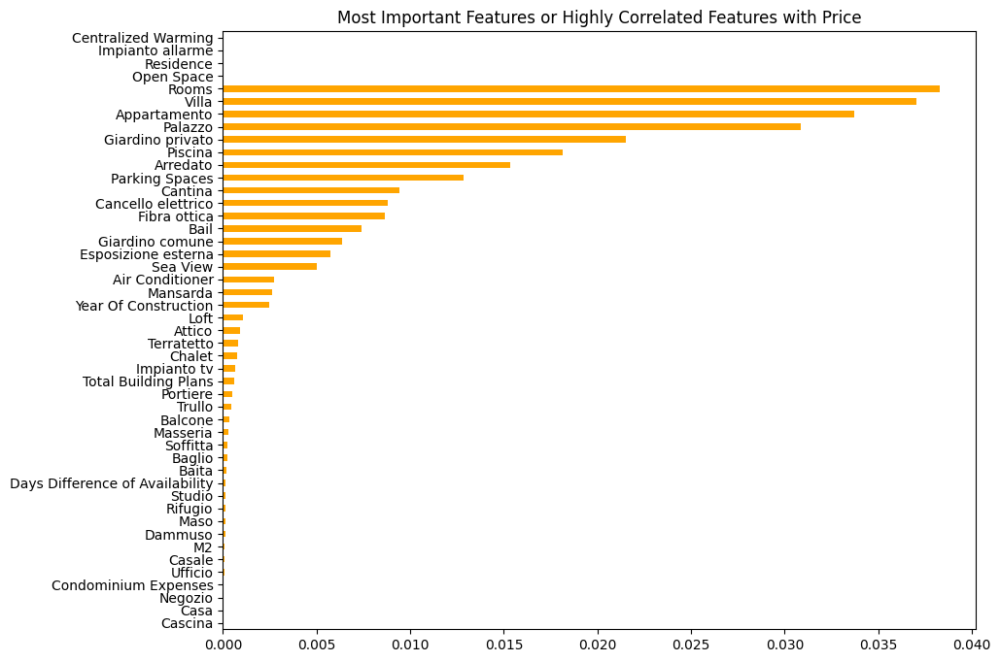

In [22]:
# Bar chart to visualize
plt.figure(figsize=(10,8))
d = df_EDA.corr()['Price'][1:].abs().sort_values().plot(kind='barh',
                                                    color='orange',
                                                    title='Most Important Features or Highly Correlated Features with Price')
plt.show()

## Location Analysis

In [23]:
# Make function to read files
def get_area_centroids(geo_file):
    coords = gpd.read_file(geo_file)
    coords['centroid'] = coords['geometry'].centroid
    coords['lon'] = coords['centroid'].x
    coords['lat'] = coords['centroid'].y
    return coords[['lat', 'lon']]

In [24]:
# Read files
region_coords = get_area_centroids('/content/drive/MyDrive/limits_IT_regions.geojson')
provinces_coords = get_area_centroids('/content/drive/MyDrive/limits_IT_provinces.geojson')
municipalities_coords = get_area_centroids('/content/drive/MyDrive/limits_IT_municipalities.geojson')

In [25]:
# Regions coordinate data information
region_coords.head(3)

,lat,lon
0,45.060558,7.923154
1,45.730201,7.387207
2,45.620697,9.769057


In [26]:
# Provinces coordinate data information
provinces_coords.head(3)

,lat,lon
0,45.144762,7.439011
1,45.525319,8.209219
2,45.563438,8.553920


In [27]:
# Municipalities coordinate data information
municipalities_coords.head(3)

,lat,lon
0,45.365909,7.775987
1,44.921764,7.483506
2,45.306808,7.282045


In [28]:
# Group by region
prices_by_region = pd.concat([df_EDA, region_coords], axis=1)
prices_by_region = prices_by_region.groupby(['City',
                                                 'lat', 'lon']).agg({'Price': 'mean'}).reset_index().sort_values(by=['Price'], ascending=True)
prices_by_region = prices_by_region[['City', 'lat', 'lon', 'Price']]
prices_by_region = prices_by_region.dropna(subset=['lat', 'lon'])

# Plot
fig = px.scatter_mapbox(
    prices_by_region, lat='lat', lon='lon',
    hover_name='City',
    hover_data=['Price'],
    color='Price',
    color_continuous_scale='turbo',
    range_color=(0, 2000),
    size='Price',
    zoom=5,
    center=dict(lat=41.8719, lon=12.5674),
    opacity=0.5,
    labels={'Price': 'Price in €'},
    height=700, width=700
                        )
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':5,'t':0,'l':0,'b':0})
fig.show()

In [29]:
# Group by province
prices_by_province = pd.concat([df_EDA, provinces_coords], axis=1)
prices_by_province = prices_by_province.groupby(['City',
                                                 'lat', 'lon']).agg({'Price': 'mean'}).reset_index().sort_values(by=['Price'], ascending=True)
prices_by_province = prices_by_province[['City', 'lat', 'lon', 'Price']]
prices_by_province = prices_by_province.dropna(subset=['lat', 'lon'])

# Plot
fig = px.scatter_mapbox(
    prices_by_province, lat='lat', lon='lon',
    hover_name='City',
    hover_data=['Price'],
    color='Price',
    color_continuous_scale='turbo',
    range_color=(0, 2000),
    size='Price',
    zoom=5,
    center=dict(lat=41.8719, lon=12.5674),
    opacity=0.5,
    labels={'Price': 'Price in €'},
    height=700, width=700
                        )
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':5,'t':0,'l':0,'b':0})
fig.show()

In [30]:
# Group by municipality
prices_by_municipalities = pd.concat([df_EDA, municipalities_coords], axis=1)
prices_by_municipalities = prices_by_municipalities.groupby(['City', 'lat', 'lon']).agg({'Price': 'mean'}).reset_index().sort_values(by=['Price'], ascending=True)
prices_by_municipalities = prices_by_municipalities[['City', 'lat', 'lon', 'Price']]
prices_by_municipalities = prices_by_municipalities.dropna(subset=['lat', 'lon'])

# Plot
fig = px.scatter_mapbox(
    prices_by_municipalities, lat='lat', lon='lon',
    hover_name='City',
    hover_data=['Price'],
    color='Price',
    color_continuous_scale='turbo',
    range_color=(0, 2000),
    size='Price',
    zoom=5,
    center=dict(lat=41.8719, lon=12.5674),
    opacity=0.5,
    labels={'Price': 'Price in €'},
    height=700, width=700
                        )
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':5,'t':0,'l':0,'b':0})
fig.show()

In [31]:
# Count distribution of region
df_EDA.Region.value_counts().sort_values(ascending=False)

LAZIO                  9325
LOMBARDIA              9310
PIEMONTE               7583
EMILIA-ROMAGNA         6559
VENETO                 4886
CAMPANIA               4553
SICILIA                4200
LIGURIA                3881
TOSCANA                3433
PUGLIA                 1978
MARCHE                 1582
UMBRIA                 1578
ABRUZZO                1323
SARDEGNA                833
TRENTINO-ALTO-ADIGE     814
CALABRIA                453
VALLE-D-AOSTA           223
BASILICATA              214
MOLISE                  201
Name: Region, dtype: int64

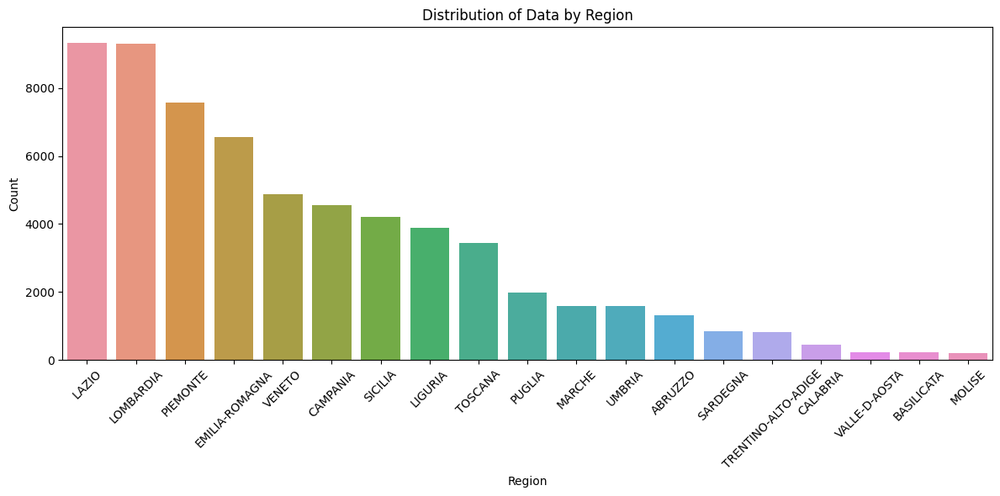

In [32]:
# Bar chart to see distribution of region
plt.figure(figsize=(12, 6))
sns.set_palette('viridis')  # Using a viridis color scheme
sns.countplot(data=df_EDA, x='Region', order=df_EDA['Region'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Distribution of Data by Region')
plt.xlabel('Region')
plt.ylabel('Count')
plt.tight_layout()

plt.show()

Text(0, 0.5, 'Region')

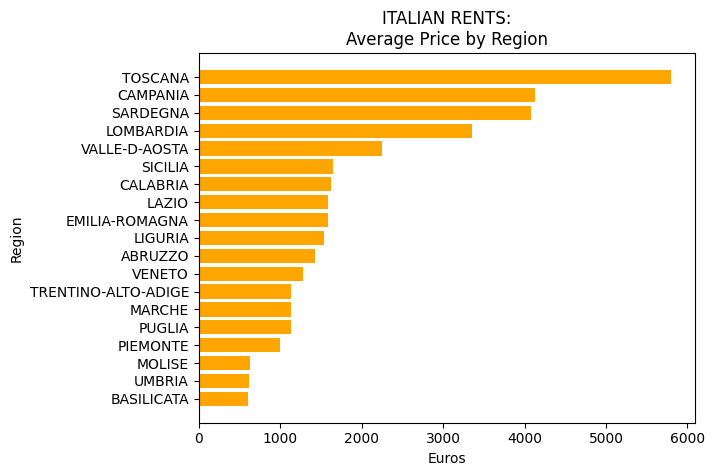

In [33]:
# Row chart to see average price by region
price_by_regione = df_EDA['Price'].groupby(df_EDA['Region']).mean().sort_values(ascending=True)
fig1, ax = plt.subplots()
ax.barh(price_by_regione.index, price_by_regione, color='orange')
ax.set_title(f'ITALIAN RENTS:\nAverage Price by Region')
ax.set_xlabel('Euros')
ax.set_ylabel('Region')

In [34]:
# Average price by region
price_by_regione

Region
BASILICATA              602.803738
UMBRIA                  610.917617
MOLISE                  626.920398
PIEMONTE                999.226955
PUGLIA                 1128.058645
MARCHE                 1132.938053
TRENTINO-ALTO-ADIGE    1138.202703
VENETO                 1281.034998
ABRUZZO                1429.684051
LIGURIA                1541.048956
EMILIA-ROMAGNA         1580.775271
LAZIO                  1590.060268
CALABRIA               1628.929360
SICILIA                1652.855000
VALLE-D-AOSTA          2249.843049
LOMBARDIA              3353.345005
SARDEGNA               4080.566627
CAMPANIA               4128.619152
TOSCANA                5799.969997
Name: Price, dtype: float64

Text(0, 0.5, 'Region')

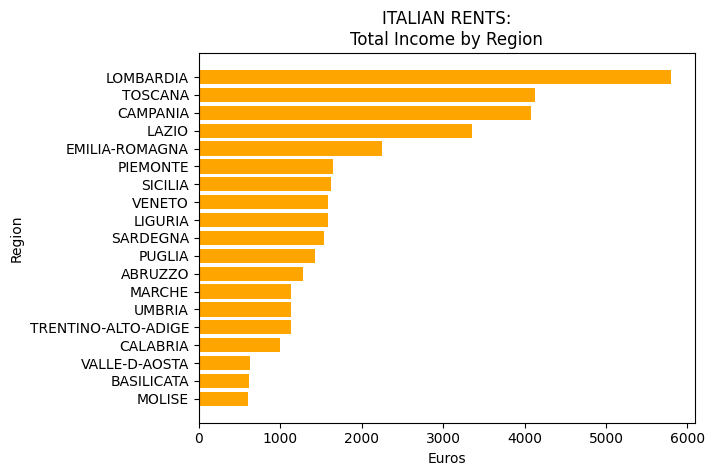

In [35]:
# Row chart to see total price in every region
sum_price_by_regione = df_EDA['Price'].groupby(df_EDA['Region']).sum().sort_values(ascending=True)
fig1, ax = plt.subplots()
ax.barh(sum_price_by_regione.index, price_by_regione, color='orange')
ax.set_title(f'ITALIAN RENTS:\nTotal Income by Region')
ax.set_xlabel('Euros')
ax.set_ylabel('Region')

In [36]:
# total price in every region
sum_price_by_regione

Region
MOLISE                   126011.0
BASILICATA               129000.0
VALLE-D-AOSTA            501715.0
CALABRIA                 737905.0
TRENTINO-ALTO-ADIGE      926497.0
UMBRIA                   964028.0
MARCHE                  1792308.0
ABRUZZO                 1891472.0
PUGLIA                  2231300.0
SARDEGNA                3399112.0
LIGURIA                 5980811.0
VENETO                  6259137.0
SICILIA                 6941991.0
PIEMONTE                7577138.0
EMILIA-ROMAGNA         10368305.0
LAZIO                  14827312.0
CAMPANIA               18797603.0
TOSCANA                19911297.0
LOMBARDIA              31219642.0
Name: Price, dtype: float64

In [37]:
# See price statistical summary
df_EDA['Price'].describe().T

count    6.294100e+04
mean     2.138495e+03
std      5.580060e+04
min      1.000000e+00
25%      5.100000e+02
50%      7.500000e+02
75%      1.300000e+03
max      1.250000e+07
Name: Price, dtype: float64

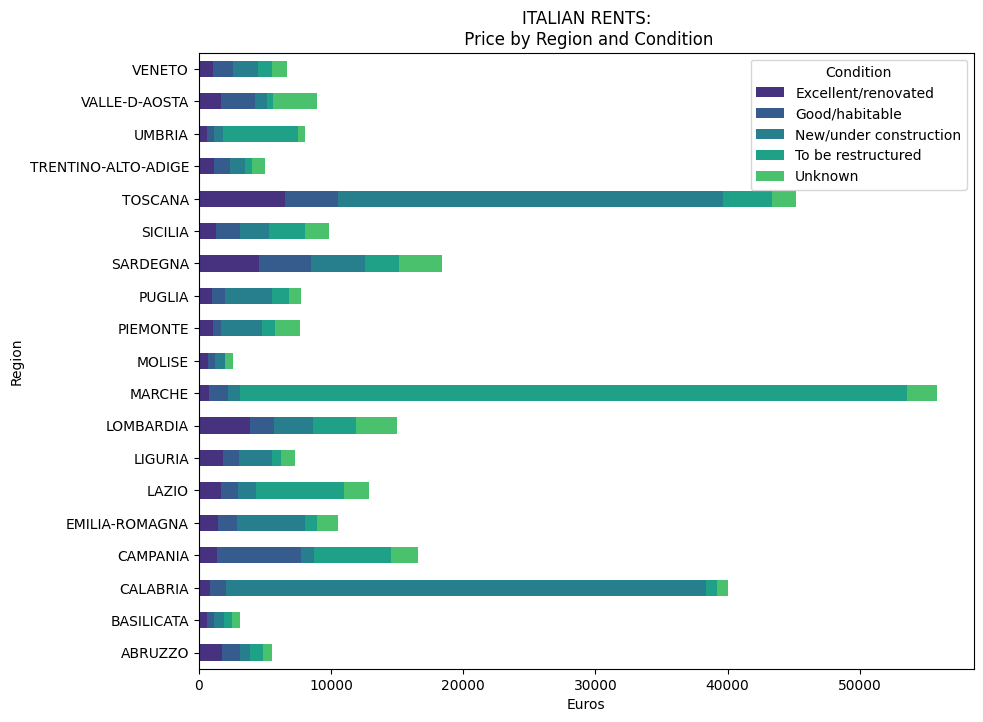

In [38]:
# Row chart to see average price by region and condition
price_by_region_condition = df_EDA.groupby(['Region', 'Condition'])['Price'].mean().unstack()

fig1, ax = plt.subplots(figsize=(10, 8))
price_by_region_condition.plot(kind='barh', stacked=True, ax=ax)
ax.set_title('ITALIAN RENTS:\n Price by Region and Condition')
ax.set_xlabel('Euros')
ax.set_ylabel('Region')

plt.show()

In [39]:
# See average price by region and condition
price_by_region_condition

Condition,Excellent/renovated,Good/habitable,New/under construction,To be restructured,Unknown
Region,,,,,
ABRUZZO,1731.122414,1370.363128,788.977273,960.000000,691.258621
BASILICATA,623.647059,563.913043,705.555556,650.000000,597.777778
CALABRIA,882.565789,1203.904594,36278.571429,800.000000,833.333333
CAMPANIA,1367.644660,6363.431071,958.762626,5825.897590,2053.617940
EMILIA-ROMAGNA,1422.087488,1470.651616,5160.317992,904.000000,1588.063037
LAZIO,1665.137749,1304.911986,1382.868313,6650.428571,1837.144578
LIGURIA,1831.192543,1229.331616,2481.707317,702.333333,1014.007752
LOMBARDIA,3887.949238,1812.417367,2915.914474,3301.200000,3102.217993
MARCHE,792.128780,1396.505464,933.132530,50416.666667,2291.000000


## Building Types and Condition

Text(0, 0.5, 'Condition')

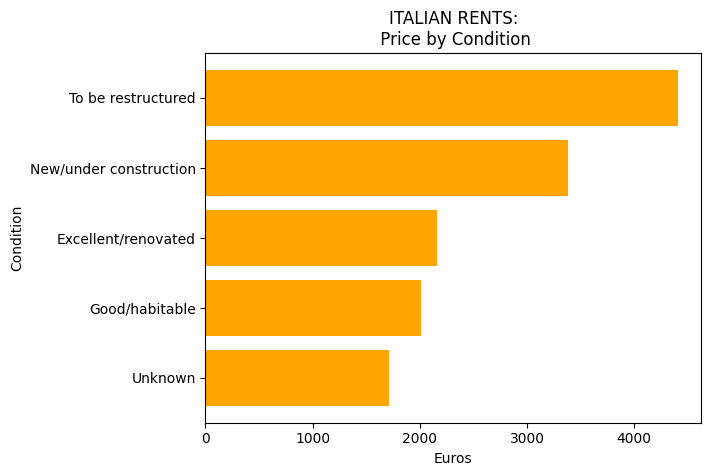

In [40]:
# Row chart to see average price by condition
price_by_condition = df_EDA['Price'].groupby(df_EDA['Condition']).mean().sort_values(ascending=True)
fig1, ax = plt.subplots()
ax.barh(price_by_condition.index, price_by_condition, color='orange')
ax.set_title(f'ITALIAN RENTS:\n Price by Condition')
ax.set_xlabel('Euros')
ax.set_ylabel('Condition')

In [41]:
# Average price by condition
price_by_condition

Condition
Unknown                   1717.252355
Good/habitable            2006.820665
Excellent/renovated       2156.689330
New/under construction    3380.449533
To be restructured        4406.668103
Name: Price, dtype: float64

<Figure size 2000x1000 with 0 Axes>

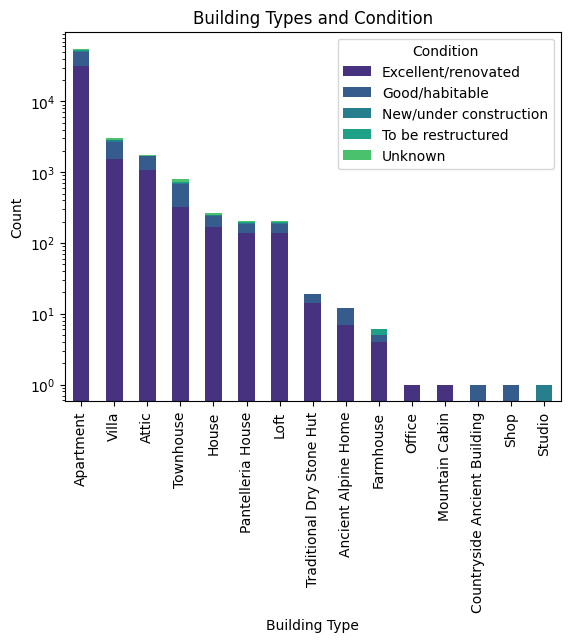

In [42]:
# Grouping types of buildings
plt.figure(figsize=(20, 10))

types = {
    'Apartment': df_EDA.loc[df_EDA['Appartamento'] == 1, 'Condition'].value_counts(),
    'House': (df_EDA.loc[df_EDA['Casa'] == 1, 'Condition'].value_counts() + df_EDA.loc[df_EDA['Casale'] == 1, 'Condition'].value_counts() + df_EDA.loc[df_EDA['Chalet'] == 1, 'Condition'].value_counts()),
    'Townhouse': df_EDA.loc[df_EDA['Terratetto'] == 1, 'Condition'].value_counts(),
    'Villa': df_EDA.loc[df_EDA['Villa'] == 1, 'Condition'].value_counts(),
    'Office': df_EDA.loc[df_EDA['Ufficio'] == 1, 'Condition'].value_counts(),
    'Ancient Alpine Home': df_EDA.loc[df_EDA['Baita'] == 1, 'Condition'].value_counts(),
    'Countryside Ancient Building': df_EDA.loc[df_EDA['Baglio'] == 1, 'Condition'].value_counts(),
    'Farmhouse': df_EDA.loc[df_EDA['Masseria'] == 1, 'Condition'].value_counts(),
    'Traditional Dry Stone Hut': df_EDA.loc[df_EDA['Trullo'] == 1, 'Condition'].value_counts(),
    'Mountain Cabin': df_EDA.loc[df_EDA['Rifugio'] == 1, 'Condition'].value_counts(),
    'Shop': df_EDA.loc[df_EDA['Negozio'] == 1, 'Condition'].value_counts(),
    'Studio': df_EDA.loc[df_EDA['Studio'] == 1, 'Condition'].value_counts(),
    'Pantelleria House': df_EDA.loc[df_EDA['Loft'] == 1, 'Condition'].value_counts(),
    'Attic': (df_EDA.loc[df_EDA['Attico'] == 1, 'Condition'].value_counts() + df_EDA.loc[df_EDA['Mansarda'] == 1, 'Condition'].value_counts() + df_EDA.loc[df_EDA['Soffitta'] == 1, 'Condition'].value_counts()),
    'Loft': df_EDA.loc[df_EDA['Loft'] == 1, 'Condition'].value_counts()
}

building_types = pd.DataFrame(types)

building_types = building_types.transpose()  # Transpose DataFrame
building_types = building_types.sort_values(by=building_types.columns.tolist(), ascending=False)  # Urutkan berdasarkan jumlah (terbanyak ke terendah)

building_types.plot(kind='bar', stacked=True)
plt.yscale('log')  # Enable logarithmic scaling on the y-axis
plt.title('Building Types and Condition')
plt.xlabel('Building Type')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='Condition')
plt.show()

<Figure size 1000x600 with 0 Axes>

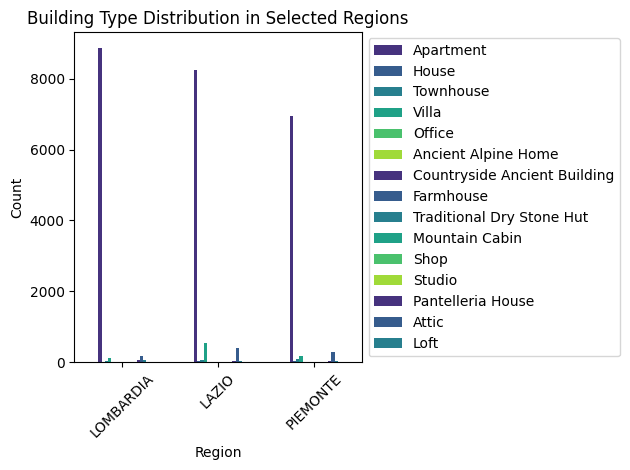

In [43]:
# Select the regions
selected_regions = ['LAZIO', 'LOMBARDIA', 'PIEMONTE']

# Create an empty dictionary to store property counts for each region
property_counts = {}

# Loop through each selected region
for selected_region in selected_regions:
    # Filter data based on the selected region
    region_data = df_EDA[df_EDA['Region'] == selected_region]

    # Count the number of properties in each type of building
    region_property_counts = {
        'Apartment': region_data['Appartamento'].sum(),
        'House': region_data['Casa'].sum() + region_data['Casale'].sum() + region_data['Chalet'].sum(),
        'Townhouse': region_data['Terratetto'].sum(),
        'Villa': region_data['Villa'].sum(),
        'Office': region_data['Ufficio'].sum(),
        'Ancient Alpine Home': region_data['Baita'].sum(),
        'Countryside Ancient Building': region_data['Baglio'].sum(),
        'Farmhouse': region_data['Masseria'].sum(),
        'Traditional Dry Stone Hut': region_data['Trullo'].sum(),
        'Mountain Cabin': region_data['Rifugio'].sum(),
        'Shop': region_data['Negozio'].sum(),
        'Studio': region_data['Studio'].sum(),
        'Pantelleria House': region_data['Loft'].sum(),
        'Attic': region_data['Attico'].sum() + region_data['Mansarda'].sum() + region_data['Soffitta'].sum(),
        'Loft': region_data['Loft'].sum()
    }

    # Add property counts to the main dictionary
    property_counts[selected_region] = region_property_counts

# Create DataFrame from dictionary
property_counts_df = pd.DataFrame.from_dict(property_counts, orient='index')
property_counts_df.index.name = 'Region'

# Sort DataFrame by Count
property_counts_df = property_counts_df.sort_values(by=['Apartment', 'House', 'Townhouse', 'Villa', 'Office', 'Ancient Alpine Home', 'Countryside Ancient Building', 'Farmhouse', 'Traditional Dry Stone Hut', 'Mountain Cabin', 'Shop', 'Studio', 'Pantelleria House', 'Attic', 'Loft'], ascending=False)

# Create bar chart
plt.figure(figsize=(10, 6))
ax = property_counts_df.plot(kind='bar')
plt.title('Building Type Distribution in Selected Regions')
plt.xlabel('Region')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Move the legend outside the plot
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

<Figure size 2500x600 with 0 Axes>

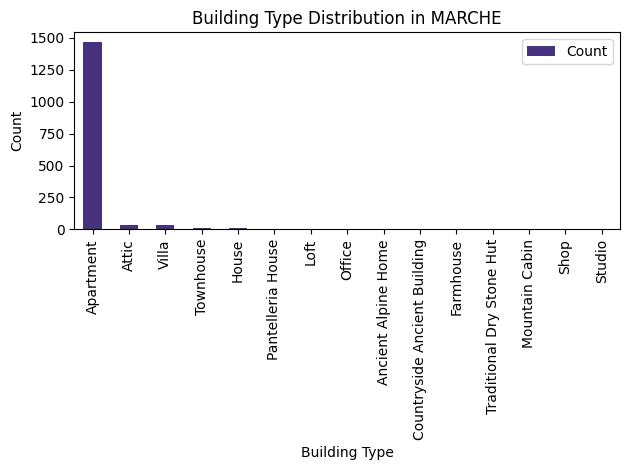

In [44]:
# Select the region with the most properties
selected_region = 'MARCHE'

# Filter data based on the selected region
region_data = df_EDA[df_EDA['Region'] == selected_region]

# Count the number of properties in each type of building
property_counts = {
    "Apartment": region_data['Appartamento'].sum(),
    "House": region_data['Casa'].sum() + region_data['Casale'].sum() + region_data['Chalet'].sum(),
    "Townhouse": region_data['Terratetto'].sum(),
    "Villa": region_data['Villa'].sum(),
    "Office": region_data['Ufficio'].sum(),
    "Ancient Alpine Home": region_data['Baita'].sum(),
    "Countryside Ancient Building": region_data['Baglio'].sum(),
    "Farmhouse": region_data['Masseria'].sum(),
    "Traditional Dry Stone Hut": region_data['Trullo'].sum(),
    "Mountain Cabin": region_data['Rifugio'].sum(),
    "Shop": region_data['Negozio'].sum(),
    "Studio": region_data['Studio'].sum(),
    "Pantelleria House": region_data['Loft'].sum(),
    "Attic": region_data['Attico'].sum() + region_data['Mansarda'].sum() + region_data['Soffitta'].sum(),
    "Loft": region_data['Loft'].sum()
}

# Create DataFrame from calculation result
property_counts_df = pd.DataFrame(list(property_counts.items()), columns=['Building Type', 'Count'])
property_counts_df.set_index('Building Type', inplace=True)

# Sort DataFrame by Count
property_counts_df = property_counts_df.sort_values(by='Count', ascending=False)

# Make bar chart
plt.figure(figsize=(25, 6))
property_counts_df.plot(kind='bar')
plt.title(f"Building Type Distribution in {selected_region}")
plt.xlabel("Building Type")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

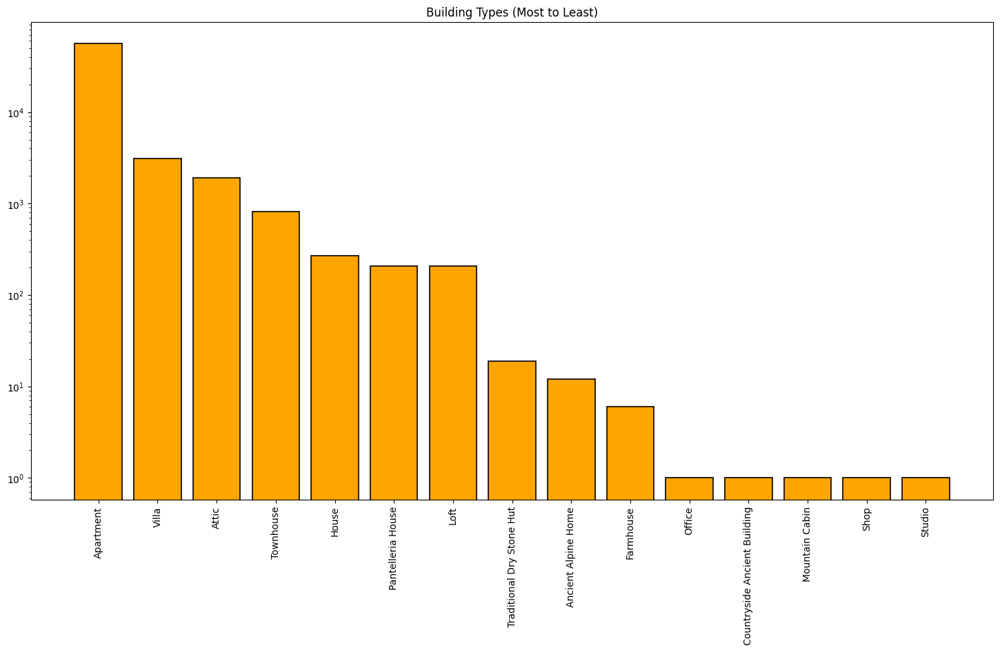

In [45]:
plt.figure(figsize=(18, 9))

types = {
    'Apartment': len(df_EDA.loc[df_EDA['Appartamento'] == 1]),
    'House': (len(df_EDA.loc[df_EDA['Casa'] == 1]) + len(df_EDA.loc[df_EDA['Casale'] == 1]) + len(df_EDA.loc[df_EDA['Chalet'] == 1])),
    'Townhouse': len(df_EDA.loc[df_EDA['Terratetto'] == 1]),
    'Villa': len(df_EDA.loc[df_EDA['Villa'] == 1]),
    'Office': len(df_EDA.loc[df_EDA['Ufficio'] == 1]),
    'Ancient Alpine Home': len(df_EDA.loc[df_EDA['Baita'] == 1]),
    'Countryside Ancient Building': len(df_EDA.loc[df_EDA['Baglio'] == 1]),
    'Farmhouse': len(df_EDA.loc[df_EDA['Masseria'] == 1]),
    'Traditional Dry Stone Hut': len(df_EDA.loc[df_EDA['Trullo'] == 1]),
    'Mountain Cabin': len(df_EDA.loc[df_EDA['Rifugio'] == 1]),
    'Shop': len(df_EDA.loc[df_EDA['Negozio'] == 1]),
    'Studio': len(df_EDA.loc[df_EDA['Studio'] == 1]),
    'Pantelleria House': len(df_EDA.loc[df_EDA['Loft'] == 1]),
    'Attic': (len(df_EDA.loc[df_EDA['Attico'] == 1]) + len(df_EDA.loc[df_EDA['Mansarda'] == 1]) + len(df_EDA.loc[df_EDA['Soffitta'] == 1])),
    'Loft': len(df_EDA.loc[df_EDA['Loft'] == 1])
}

# Sort variable types by value (amount) in descending order
sorted_types = {k: v for k, v in sorted(types.items(), key=lambda item: item[1], reverse=True)}

plt.bar(sorted_types.keys(), sorted_types.values(), color='orange', edgecolor='black', linewidth=1.2)  # Atur warna dan ketebalan batang
plt.yscale('log')  # Enable logarithmic scaling on the y-axis
plt.title('Building Types (Most to Least)')
plt.xticks(rotation=90)

plt.show()

In [46]:
sorted_types

{'Apartment': 55999,
 'Villa': 3095,
 'Attic': 1900,
 'Townhouse': 810,
 'House': 271,
 'Pantelleria House': 206,
 'Loft': 206,
 'Traditional Dry Stone Hut': 19,
 'Ancient Alpine Home': 12,
 'Farmhouse': 6,
 'Office': 1,
 'Countryside Ancient Building': 1,
 'Mountain Cabin': 1,
 'Shop': 1,
 'Studio': 1}

## Time Analysis

In [47]:
# Change to datetime type
df_EDA['Datetime'] = pd.to_datetime(df_EDA['Datetime'])

In [48]:
df_EDA['Datetime'].unique()

array(['2023-07-03T00:00:00.000000000', '2022-12-21T00:00:00.000000000',
       '2023-06-03T00:00:00.000000000', '2023-12-02T00:00:00.000000000',
       '2023-08-03T00:00:00.000000000', '2023-03-03T00:00:00.000000000',
       '2022-08-08T00:00:00.000000000', '2022-11-17T00:00:00.000000000',
       '2023-11-02T00:00:00.000000000', '2022-12-12T00:00:00.000000000',
       '2023-06-02T00:00:00.000000000', '2022-12-16T00:00:00.000000000',
       '2023-02-27T00:00:00.000000000', '2023-01-14T00:00:00.000000000',
       '2022-10-27T00:00:00.000000000', '2023-02-03T00:00:00.000000000',
       '2022-06-10T00:00:00.000000000', '2022-12-13T00:00:00.000000000',
       '2023-02-19T00:00:00.000000000', '2023-01-23T00:00:00.000000000',
       '2022-06-23T00:00:00.000000000', '2023-01-21T00:00:00.000000000',
       '2023-02-01T00:00:00.000000000', '2023-02-28T00:00:00.000000000',
       '2022-10-11T00:00:00.000000000', '2023-01-31T00:00:00.000000000',
       '2023-09-02T00:00:00.000000000', '2022-07-05

In [49]:
# Make copy for EDA
df_EDA_Time = copy.deepcopy(df_EDA)

In [50]:
import datetime
from datetime import date

# TODAY = np.datetime64(date.today())
# df_EDA_Time = df_EDA.loc[(df_EDA['Datetime']>'01-01-2023') & (df_EDA['Datetime']<TODAY)]

df_EDA_Time = df_EDA.loc[(df_EDA['Datetime'] > '01-01-2023') & (df_EDA['Datetime'] < '31-07-2023')]
df_EDA_Time['Year'] = df_EDA['Datetime'].dt.to_period('Y').dt.start_time
df_EDA_Time['Month'] = df_EDA['Datetime'].dt.to_period('M').dt.start_time
df_EDA_Time['Week'] = df_EDA['Datetime'].dt.to_period('W').dt.start_time
df_EDA_Time['Date'] = df_EDA['Datetime'].dt.to_period('D').dt.start_time

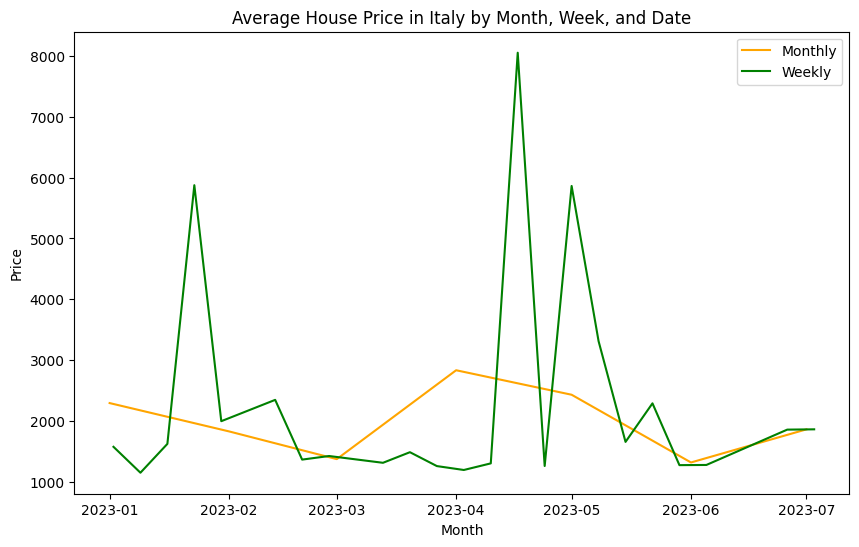

In [51]:
# Set figure size and title
plt.figure(figsize=(10, 6))
plt.title('Average House Price in Italy by Month, Week, and Date')

# Mean price in Italy by month
mean_price_month = df_EDA_Time.groupby('Month')['Price'].mean().reset_index()
sns.lineplot(data=mean_price_month, x='Month', y='Price', color='orange', label='Monthly')

# Mean price in Italy by week
mean_price_week = df_EDA_Time.groupby('Week')['Price'].mean().reset_index()
sns.lineplot(data=mean_price_week, x='Week', y='Price', color='green', label='Weekly')

# Mean price in Italy by date
# mean_price_date = df_EDA_Time.groupby('Date')['Price'].mean().reset_index()
# sns.lineplot(data=mean_price_date, x='Date', y='Price', color='orange', label='Daily')

# Set x-axis labels rotation
plt.xticks()

# Show legend
plt.legend()

# Show the plot
plt.show()

In [52]:
mean_price_month

,Month,Price
0,2023-01-01,2296.155413
1,2023-02-01,1831.185523
2,2023-03-01,1375.802197
3,2023-04-01,2835.198941
4,2023-05-01,2432.974648
5,2023-06-01,1320.869909
6,2023-07-01,1864.811532


In [53]:
# Sample data
data = {'Month': ['2023-01-01', '2023-02-01', '2023-03-01', '2023-04-01', '2023-05-01', '2023-06-01', '2023-07-01'],
        'Price': [2296.155413, 1831.185523, 1375.802197, 2835.198941, 2432.974648, 1320.869909, 1864.811532]}

# Create a DataFrame
df_temp = pd.DataFrame(data)

# Calculate the total price for all months
total_price = df_temp['Price'].sum()

# Calculate the percentage for each month
df_temp['Percentage'] = (df_temp['Price'] / total_price) * 100

# Print the resulting DataFrame
print(df_temp)

        Month        Price  Percentage
0  2023-01-01  2296.155413   16.451642
1  2023-02-01  1831.185523   13.120196
2  2023-03-01  1375.802197    9.857436
3  2023-04-01  2835.198941   20.313816
4  2023-05-01  2432.974648   17.431934
5  2023-06-01  1320.869909    9.463854
6  2023-07-01  1864.811532   13.361122


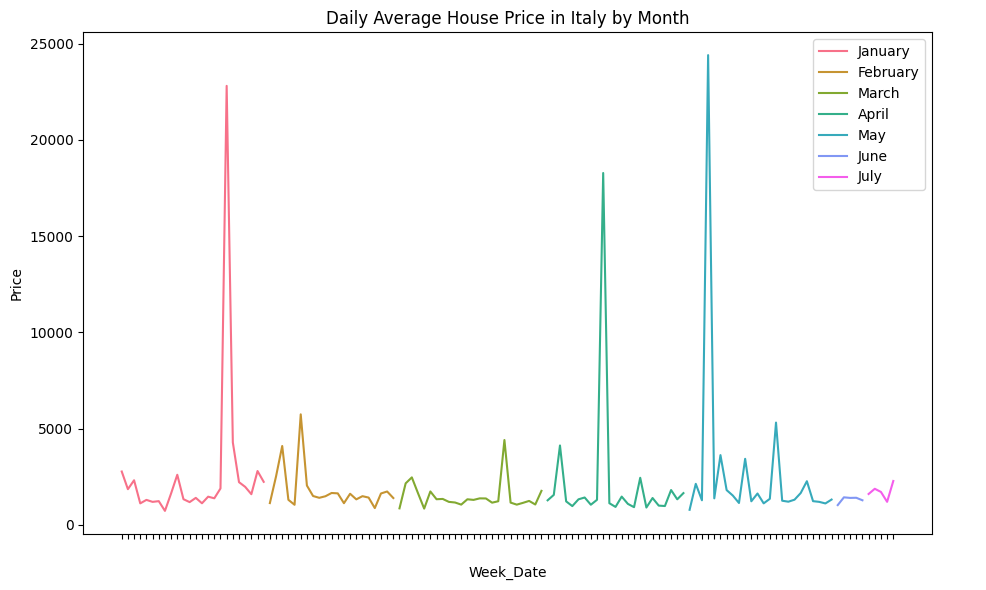

In [54]:
# Set figure size and title
plt.figure(figsize=(10, 6))
plt.title('Daily Average House Price in Italy by Month')

# Merge the 'Week' and 'Date' columns into one new column
df_EDA_Time['Week_Date'] = df_EDA_Time['Week'].astype(str) + '_' + df_EDA_Time['Date'].astype(str)

# Calculate the average price based on the new column
mean_price_italy = df_EDA_Time.groupby(['Month', 'Week_Date'])['Price'].mean().reset_index()

# Change the date format in the 'Month' column to the name of the month
mean_price_italy['Month'] = pd.to_datetime(mean_price_italy['Month'], format='%Y-%m-%d').dt.strftime('%B')

# Plot lines with hue
sns.lineplot(data=mean_price_italy, x='Week_Date', y='Price', hue='Month')

# Set legend label to month name only
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles=handles, labels=labels)

# Set x-axis labels rotation
plt.xticks(rotation=1, alpha=0)

# Optimization of the plot display layout
plt.tight_layout()

# Show the plot
plt.show()

<Axes: xlabel='Month', ylabel='Price'>

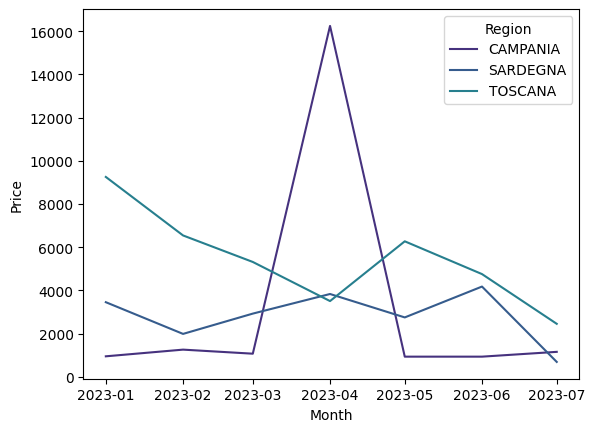

In [55]:
# The highest average income in region
REGIONS = ['TOSCANA', 'CAMPANIA', 'SARDEGNA']
df_regions = df_EDA_Time.loc[df_EDA_Time['Region'].isin(REGIONS)]
mean_price_region_highest = df_regions.groupby(['Month', 'Region'])['Price'].mean().reset_index()
sns.lineplot(data=mean_price_region_highest, x='Month', y='Price', hue='Region')

In [56]:
mean_price_region_highest

,Month,Region,Price
0,2023-01-01,CAMPANIA,952.783251
1,2023-01-01,SARDEGNA,3457.058824
2,2023-01-01,TOSCANA,9253.411765
3,2023-02-01,CAMPANIA,1262.082143
4,2023-02-01,SARDEGNA,1989.888889
5,2023-02-01,TOSCANA,6546.250000
6,2023-03-01,CAMPANIA,1074.284483
7,2023-03-01,SARDEGNA,2929.212766
8,2023-03-01,TOSCANA,5319.166667
9,2023-04-01,CAMPANIA,16242.098401


<Axes: xlabel='Month', ylabel='Price'>

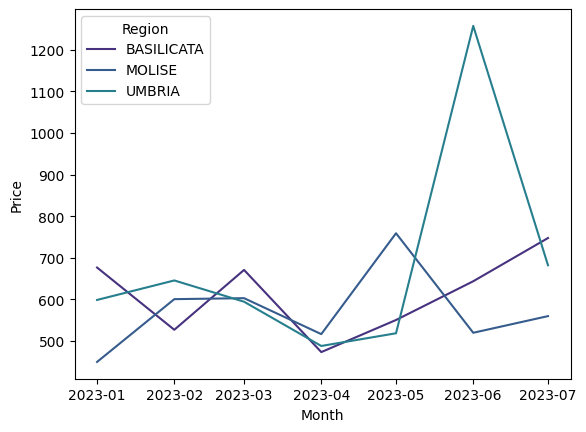

In [57]:
# The lowest average income in region
REGIONS = ['BASILICATA', 'UMBRIA', 'MOLISE']
df_regions = df_EDA_Time.loc[df_EDA_Time['Region'].isin(REGIONS)]
mean_price_region_lowest = df_regions.groupby(['Month', 'Region'])['Price'].mean().reset_index()
sns.lineplot(data=mean_price_region_lowest, x='Month', y='Price', hue='Region')

In [58]:
mean_price_region_lowest

,Month,Region,Price
0,2023-01-01,BASILICATA,676.666667
1,2023-01-01,MOLISE,450.000000
2,2023-01-01,UMBRIA,598.840580
3,2023-02-01,BASILICATA,527.187500
4,2023-02-01,MOLISE,600.733333
5,2023-02-01,UMBRIA,645.657895
6,2023-03-01,BASILICATA,670.930233
7,2023-03-01,MOLISE,603.095238
8,2023-03-01,UMBRIA,594.598071
9,2023-04-01,BASILICATA,473.611111


<Axes: xlabel='Month', ylabel='Price'>

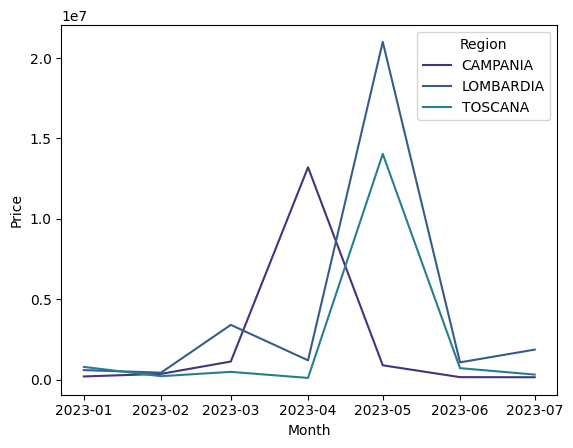

In [59]:
# The highest total income
REGIONS = ['LOMBARDIA', 'TOSCANA', 'CAMPANIA']
df_regions = df_EDA_Time.loc[df_EDA_Time['Region'].isin(REGIONS)]
sum_price_region_highest = df_regions.groupby(['Month', 'Region'])['Price'].sum().reset_index()
sns.lineplot(data=sum_price_region_highest, x='Month', y='Price', hue='Region')

In [60]:
sum_price_region_highest

,Month,Region,Price
0,2023-01-01,CAMPANIA,193415.0
1,2023-01-01,LOMBARDIA,589183.0
2,2023-01-01,TOSCANA,786540.0
3,2023-02-01,CAMPANIA,353383.0
4,2023-02-01,LOMBARDIA,428584.0
5,2023-02-01,TOSCANA,209480.0
6,2023-03-01,CAMPANIA,1121553.0
7,2023-03-01,LOMBARDIA,3401619.0
8,2023-03-01,TOSCANA,478725.0
9,2023-04-01,CAMPANIA,13204826.0


<Axes: xlabel='Month', ylabel='Price'>

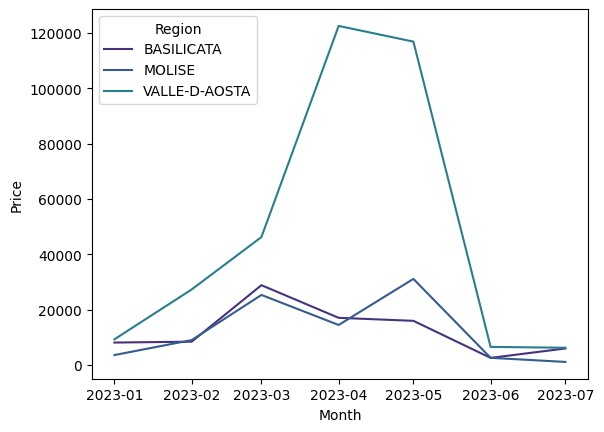

In [61]:
# The lowest total income
REGIONS = ['BASILICATA', 'VALLE-D-AOSTA', 'MOLISE']
df_regions = df_EDA_Time.loc[df_EDA_Time['Region'].isin(REGIONS)]
sum_price_region_lowest = df_regions.groupby(['Month', 'Region'])['Price'].sum().reset_index()
sns.lineplot(data=sum_price_region_lowest, x='Month', y='Price', hue='Region')

In [62]:
sum_price_region_lowest

,Month,Region,Price
0,2023-01-01,BASILICATA,8120.0
1,2023-01-01,MOLISE,3600.0
2,2023-01-01,VALLE-D-AOSTA,9295.0
3,2023-02-01,BASILICATA,8435.0
4,2023-02-01,MOLISE,9011.0
5,2023-02-01,VALLE-D-AOSTA,27305.0
6,2023-03-01,BASILICATA,28850.0
7,2023-03-01,MOLISE,25330.0
8,2023-03-01,VALLE-D-AOSTA,46245.0
9,2023-04-01,BASILICATA,17050.0


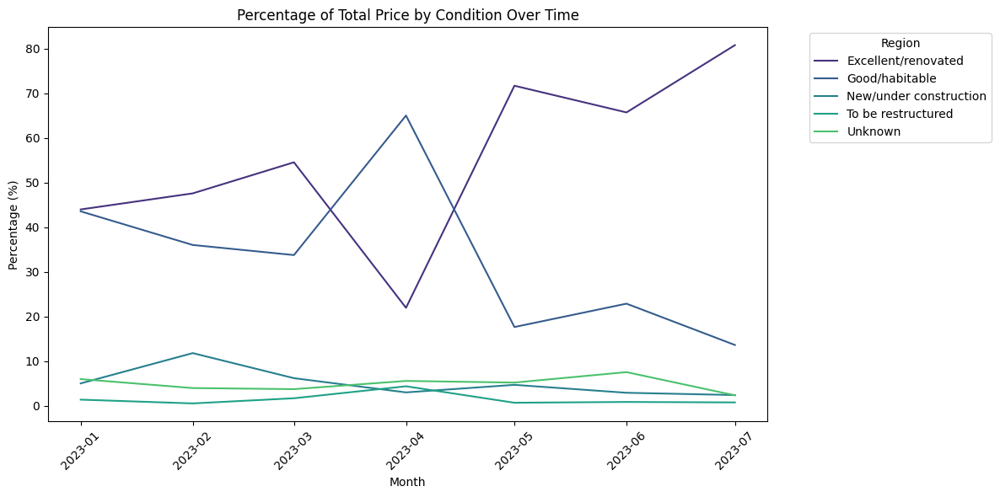

In [63]:
# Calculate the total sum of prices for each month
total_price_per_month = df_EDA_Time.groupby('Month')['Price'].sum()

# Calculate the percentage of each region's contribution to the total price per month
df_percentage = df_EDA_Time.groupby(['Month', 'Condition'])['Price'].sum() / total_price_per_month * 100
df_percentage = df_percentage.reset_index()

# Plot the percentage of each region's contribution over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_percentage, x='Month', y='Price', hue='Condition')
plt.title('Percentage of Total Price by Condition Over Time')
plt.xlabel('Month')
plt.ylabel('Percentage (%)')
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [64]:
df_percentage

,Month,Condition,Price
0,2023-01-01,Excellent/renovated,44.005528
1,2023-01-01,Good/habitable,43.580334
2,2023-01-01,New/under construction,5.030714
3,2023-01-01,To be restructured,1.391383
4,2023-01-01,Unknown,5.992041
5,2023-02-01,Excellent/renovated,47.607174
6,2023-02-01,Good/habitable,36.046266
7,2023-02-01,New/under construction,11.816523
8,2023-02-01,To be restructured,0.544884
9,2023-02-01,Unknown,3.985153


## Other EDAs

### Multivariate

In [65]:
def categorical_data(df,title,hue):
    plt.figure(figsize=(20,8))
    g=sns.catplot(x=title,kind='count', hue=hue, palette='viridis', data=df)
    ax = g.facet_axis(0,0)
    plt.xticks(rotation=90)
    for p in ax.patches:
        ax.text(p.get_x() + 0.02,
                p.get_height() * 1.02,
                '{0:.1f}'.format(p.get_height()),
                color='black', rotation='vertical',
                ha='center', va='bottom', size='x-small')

<Figure size 2000x800 with 0 Axes>

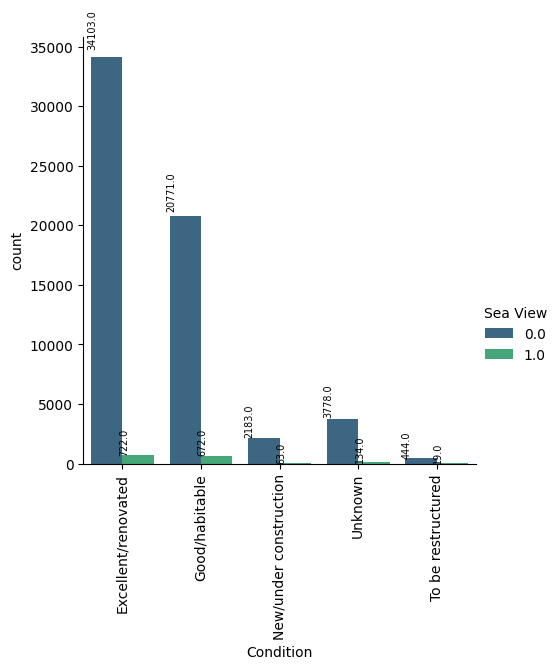

In [66]:
categorical_data(df_EDA,'Condition','Sea View')

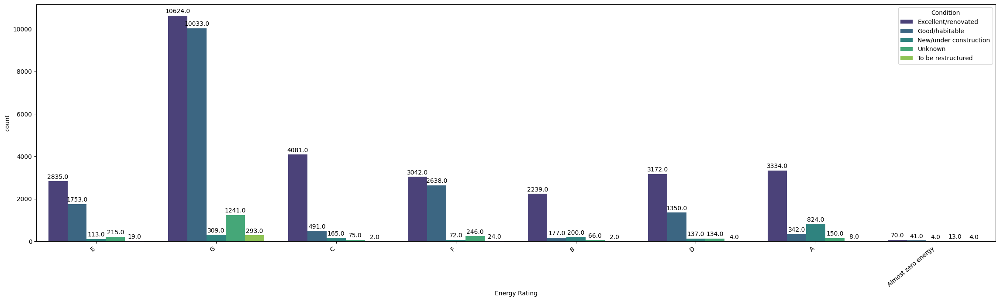

In [67]:
plt.figure(figsize=(23,7))
ax = sns.countplot(x='Energy Rating', hue='Condition', palette='viridis', data=df_EDA)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha='right')

# Plus a label number count in each bar (horizontal annotation)
for p in ax.patches:
    ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height() + 50),
                ha='center', va='bottom', rotation=0)  # Set rotation=0 for horizontal annotation

plt.tight_layout()
plt.show()

### Bivariate

In [68]:
def dist_bivariate(df,title,hue):
  plt.figure(figsize=(12, 8)) # Set plot size here (eg 12x8)
  sns.set(style='whitegrid')
  g = sns.FacetGrid(df, hue=hue, palette='cubehelix', height=6, aspect=1.5)  # Set the height and width-height proportions here
  g.map(sns.distplot, title).add_legend()

<Figure size 1200x800 with 0 Axes>

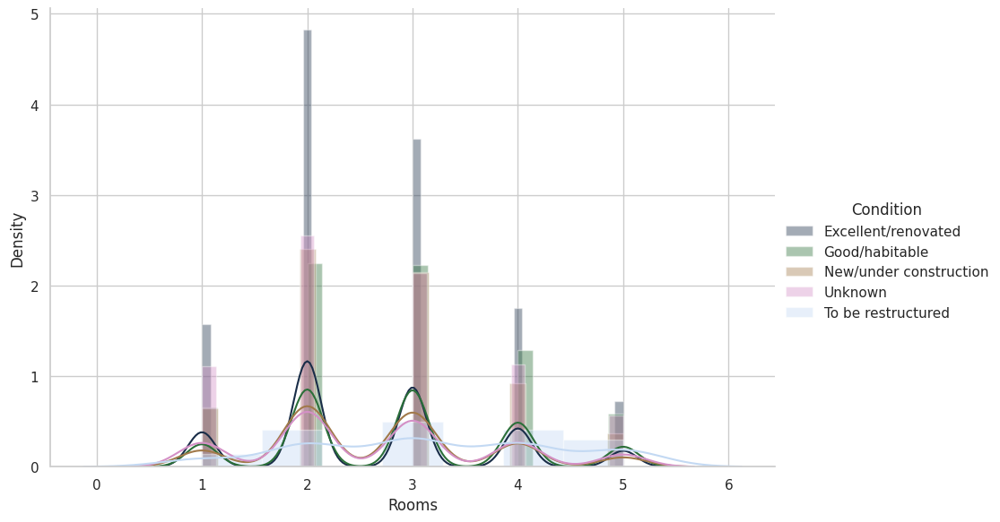

In [69]:
dist_bivariate(df_EDA,'Rooms', 'Condition')

# Data Preprocessing

In [70]:
# Total missing values
total_missing = df.isnull().sum().sum()
print('Total missing values:', total_missing)

Total missing values: 165074


In [71]:
# Percentage missing value rows
total_rows = len(df)
total_missing = df.isnull().sum().sum()
missing_percentage = (total_missing / (total_rows * len(df.columns))) * 100
print('Percentage of overall missing value:', missing_percentage, '%')

Percentage of overall missing value: 4.521859278174579 %


In [72]:
# Checking missing value
def show_missing_columns(df):
    # Counts the number of missing values in each column
    missing_values = df.isna().sum()

    # Calculate the percentage of missing values in each column
    percent_missing = (missing_values / len(df)) * 100

    # Combine both Series into a DataFrame
    missing_df = pd.concat([missing_values, percent_missing], axis=1, keys=['Total Missing Values', 'Percentage'])

    # Select columns with missing values
    missing_columns = missing_df.loc[missing_df['Total Missing Values'] > 0]

    # Show DataFrame
    return missing_columns

# See missing value
show_missing_columns(df)

,Total Missing Values,Percentage
Rooms,4516,7.174973
M2,577,0.916732
Bathrooms,1613,2.562717
Locals,716,1.137573
Total Building Plans,3267,5.190575
Quarter,3512,5.579829
Condominium Expenses,14352,22.802307
Bail,37422,59.455681
Year Of Construction,28114,44.667228
Air Conditioner,32434,51.530799


In [73]:
# Determine the threshold for the percentage of missing values
threshold = 0.2  # 20%

# Count the number of missing values in each column
missing_values = df.isna().sum()

# Specify the column to be deleted based on the threshold
columns_to_drop = missing_values[missing_values > threshold * df.shape[0]].index

# Remove the columns from the dataset
data_cleaned = df.drop(columns=columns_to_drop)

# Show cleaned dataset
data_cleaned.head(1)

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condition,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating
0,1800.0,3.0,60.0,1,"Affitto, libero","3 (2 camere da letto, 1 altro), 1 bagno, cucin...",10.0,1,Milano,Centrale,https://www.immobiliare.it/annunci/101614827/,Excellent/renovated,NaN,0.0,2023-07-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1.0,E


In [74]:
# Dataset size
data_cleaned.shape

(62941, 53)

### Checking Column Importance Using Catboost

In [75]:
# Drop duplikated data
data_cleaned[data_cleaned.duplicated(keep=False)]

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condition,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating


In [76]:
print('Before drop duplicated data')
data_cleaned.shape

Before drop duplicated data


(62941, 53)

In [77]:
data_cleaned = data_cleaned.drop_duplicates(keep='first')

In [78]:
print('After drop duplicated data')
data_cleaned.shape

After drop duplicated data


(62941, 53)

In [79]:
# Check again for duplicated data
data_cleaned[data_cleaned.duplicated(keep=False)]

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condition,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating


In [80]:
# Check the information of the data
data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 62941 entries, 0 to 62940
Data columns (total 53 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Price                 62941 non-null  float64
 1   Rooms                 58425 non-null  float64
 2   M2                    62364 non-null  float64
 3   Bathrooms             61328 non-null  object 
 4   Contract              62941 non-null  object 
 5   Locals                62225 non-null  object 
 6   Total Building Plans  59674 non-null  float64
 7   Parking Spaces        62941 non-null  int64  
 8   City                  62941 non-null  object 
 9   Quarter               59429 non-null  object 
 10  Href                  62941 non-null  object 
 11  Condition             62941 non-null  object 
 12  Region                62929 non-null  object 
 13  Sea View              62889 non-null  float64
 14  Datetime              62941 non-null  object 
 15  Villa              

### Missing Value Processing

In [81]:
# See missing values
show_missing_columns(data_cleaned)

,Total Missing Values,Percentage
Rooms,4516,7.174973
M2,577,0.916732
Bathrooms,1613,2.562717
Locals,716,1.137573
Total Building Plans,3267,5.190575
Quarter,3512,5.579829
Region,12,0.019065
Sea View,52,0.082617
Centralized Warming,9912,15.748082
Energy Rating,12399,19.699401


#### Rooms

After tracing, the data in the Locals column contains the number of rooms, namely the first letter. Filling NaN in Rooms will be filled with the number of rooms from the Locals column.

In [82]:
# NaN imputation from Locals rows
data_cleaned['Rooms'] = data_cleaned['Rooms'].fillna(data_cleaned['Locals'].str[0])

In [83]:
# Check again the missing values
data_cleaned['Rooms'].isna().sum()

715

In [84]:
data_cleaned['Rooms'].unique()

array([3.0, 2.0, '5', 5.0, 1.0, 4.0, '1', nan, 'c', '6', '8', '3', '7',
       '2', '4', '9'], dtype=object)

In [85]:
# Change the value of 'c' to NaN in the column 'Rooms'
data_cleaned['Rooms'] = data_cleaned['Rooms'].replace('c', pd.NA)

In [86]:
# Convert the column to float
data_cleaned['Rooms'] = pd.to_numeric(data_cleaned['Rooms'], errors='coerce')

#### Bathrooms

Filling in NaN in the Bathrooms column will be filled from the Locals row which is the number before the word bagni or bagno. (bagni/bagno means bathroom in Italian).

In [87]:
data_cleaned['Bathrooms'].unique()

array(['1', '3+', '3', '2', 'T', 'R', '5', nan, '7', '4', '6', '1 - 2',
       'S', '8', '2 - 3', '12', '9', '15', '19'], dtype=object)

In [88]:
data_cleaned[data_cleaned['Bathrooms'] == 'T']

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condition,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating
194,400.0,3.0,360.0,T,Affitto,"3 (2 camere da letto, 1 altro), cucina abitabile",3.0,1,Catanzaro,Pontegrande - Sant'Elia,https://www.immobiliare.it/annunci/94212774/,Excellent/renovated,CALABRIA,0.0,2022-04-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1.0,NaN
1839,700.0,1.0,134.0,T,Affitto,1 locale,NaN,0,Avezzano,Via oslavia,https://www.immobiliare.it/annunci/92393678/,Good/habitable,ABRUZZO,0.0,2023-09-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,NaN
2172,500.0,1.0,72.0,T,Affitto,1 locale,2.0,0,Assisi,Via raffaello,https://www.immobiliare.it/annunci/101757541/,Good/habitable,UMBRIA,0.0,2023-03-14,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,E
2526,800.0,3.0,2.0,T,Affitto,"3 (2 camere da letto, 1 altro), 2 bagni",1.0,1,Rovereto,Via Mazzini,https://www.immobiliare.it/annunci/101839628/,Unknown,TRENTINO-ALTO-ADIGE,0.0,2023-03-17,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1.0,NaN
2537,350.0,1.0,50.0,T,"Affitto, 3+2","1 bagno, cucina angolo cottura",1.0,1,Gualdo Cattaneo,Gualdo Cattaneo,https://www.immobiliare.it/annunci/101878832/,New/under construction,UMBRIA,0.0,2023-03-17,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,1.0,G
2741,1200.0,3.0,60.0,T,"Affitto, libero",3 locali,2.0,0,Milano,Corvetto,https://www.immobiliare.it/annunci/102031906/,Excellent/renovated,LOMBARDIA,0.0,2023-03-24,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1.0,Almost zero energy
4498,750.0,1.0,130.0,T,"Affitto, 6+6",1 locale,NaN,0,Vo',Via dei Colli,https://www.immobiliare.it/annunci/96595414/,Good/habitable,VENETO,0.0,2023-02-21,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,D
4607,6500.0,1.0,2000.0,T,"Affitto, 6+6",1 locale,1.0,0,Teolo,Via Euganea San Biagio,https://www.immobiliare.it/annunci/97721344/,Good/habitable,VENETO,0.0,2023-02-21,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1.0,G
4693,2700.0,1.0,37.0,T,"Affitto, 6+6","1 locale, cucina cucinotto",2.0,0,Venezia,San Marco,https://www.immobiliare.it/annunci/93026308/,Good/habitable,VENETO,0.0,2022-04-10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1.0,G
4719,500.0,2.0,1.0,T,"Affitto, 4+4","2 (1 camera da letto, 1 altro), 1 bagno, cucin...",1.0,0,Este,via rovigo,https://www.immobiliare.it/annunci/101932818/,Unknown,VENETO,0.0,2023-03-20,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,NaN,F


In [89]:
data_cleaned['Locals'].unique()

array(['3 (2 camere da letto, 1 altro), 1 bagno, cucina a vista',
       '2 (1 camera da letto, 1 altro), 1 bagno, cucina abitabile',
       '5+ (5 camere da letto, 3 altri), 3+ bagni, cucina abitabile', ...,
       '5+ (4 camere da letto, 3 altri), 3 bagni - uno o più adatto a persone disabili',
       '3 (1 camera da letto, 2 altri), cucina semi abitabile',
       '5+ (4 camere da letto, 3 altri), 1 bagno, cucina angolo cottura'],
      dtype=object)

In [90]:
# See values in Locals
data_cleaned[data_cleaned['Locals'] == '5+ (5 camere da letto, 3 altri), 3+ bagni, cucina abitabile']

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condition,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating
2,3200.0,5.0,400.0,3+,Affitto,"5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",3.0,1,Padova,Prato della Valle - Pontecorvo,https://www.immobiliare.it/annunci/62705714/,Excellent/renovated,NaN,0.0,2023-07-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1.0,E
643,5200.0,5.0,390.0,3+,"Affitto, 3+2","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",3.0,1,Roma,Cortina d'Ampezzo,https://www.immobiliare.it/annunci/100390182/,Excellent/renovated,LAZIO,0.0,2023-09-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,1,0,1,0,1.0,F
839,25000.0,5.0,700.0,3+,"Affitto, transitorio","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",2.0,1,Olbia,Via della Cava del Tom,https://www.immobiliare.it/annunci/101736977/,Excellent/renovated,SARDEGNA,1.0,2023-03-13,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1,0,0,1,0,0,1,1.0,A
6614,2400.0,5.0,290.0,3+,"Affitto, 4+4","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",2.0,1,Giugliano in Campania,Via Lago Patria,https://www.immobiliare.it/annunci/95725160/,Good/habitable,CAMPANIA,0.0,2023-03-23,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,1,0,0,1,1.0,G
6642,16000.0,5.0,600.0,3+,Affitto,"5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",3.0,1,Napoli,Posillipo,https://www.immobiliare.it/annunci/100492434/,Excellent/renovated,CAMPANIA,0.0,2023-02-02,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,1,0,1,0,1,1,1.0,F
7181,1500.0,5.0,325.0,3+,"Affitto, 4+4","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",2.0,1,Pozzuoli,Via Reginelle,https://www.immobiliare.it/annunci/99522884/,To be restructured,CAMPANIA,0.0,2022-11-17,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,0,1.0,G
7870,100000.0,5.0,700.0,3+,"Affitto, concordato","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",2.0,1,Taormina,Via Nazionale,https://www.immobiliare.it/annunci/101962232/,Excellent/renovated,SICILIA,0.0,2023-03-21,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,1,0,1,0,0,1,1.0,E
9733,12000.0,5.0,260.0,3+,"Affitto, transitorio","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",1.0,1,Rapallo,San Maurizio - Montallegro,https://www.immobiliare.it/annunci/91041940/,Excellent/renovated,LIGURIA,0.0,2023-07-02,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,0,1,1.0,G
10898,5000.0,5.0,346.0,3+,"Affitto, 4+4","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",3.0,1,Bologna,Saragozza dentro le Mura,https://www.immobiliare.it/annunci/101934698/,Good/habitable,EMILIA-ROMAGNA,0.0,2023-03-28,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,1.0,D
12530,4000.0,5.0,280.0,3+,"Affitto, 3+2","5+ (5 camere da letto, 3 altri), 3+ bagni, cuc...",5.0,1,Roma,Vigna Clara - Vigna Stelluti,https://www.immobiliare.it/annunci/102208048/,Excellent/renovated,LAZIO,0.0,2023-03-04,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,1.0,G


In [91]:
# See values in Locals
data_cleaned[data_cleaned['Locals'] == '3+ bagni - uno o più adatto a persone disabili']

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condition,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating
6902,15000.0,3.0,3.0,NaN,Affitto,3+ bagni - uno o più adatto a persone disabili,4.0,1,Avellino,Via Zoccolari,https://www.immobiliare.it/annunci/89188927/,Good/habitable,CAMPANIA,0.0,2021-06-30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1.0,F
7204,11000.0,3.0,3.0,NaN,Affitto,3+ bagni - uno o più adatto a persone disabili,4.0,0,Caserta,San Clemente,https://www.immobiliare.it/annunci/93816422/,To be restructured,CAMPANIA,0.0,2022-02-21,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,G


In [92]:
# See NaN in Bathrooms
data_cleaned[data_cleaned['Bathrooms'].isna()]

,Price,Rooms,M2,Bathrooms,Contract,Locals,Total Building Plans,Parking Spaces,City,Quarter,Href,Condition,Region,Sea View,Datetime,Villa,Palazzo,Casa,Casale,Cascina,Appartamento,Chalet,Terratetto,Attico,Loft,Mansarda,Open Space,Ufficio,Baita,Baglio,Masseria,Trullo,Rifugio,Soffitta,Negozio,Residence,Studio,Maso,Dammuso,Arredato,Balcone,Impianto tv,Esposizione esterna,Fibra ottica,Cancello elettrico,Cantina,Giardino comune,Giardino privato,Impianto allarme,Portiere,Piscina,Centralized Warming,Energy Rating
574,850.0,2.0,50.0,NaN,"Affitto, 4+4",2 locali,NaN,0,Firenze,Castello,https://www.immobiliare.it/annunci/97446820/,Excellent/renovated,TOSCANA,0.0,2022-07-26,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,NaN,NaN
589,1000.0,3.0,164.0,NaN,"Affitto, 4+4","3 (1 camera da letto, 2 altri), 1 bagno, cucin...",NaN,0,Firenze,Isolotto Talenti,https://www.immobiliare.it/annunci/101290999/,Excellent/renovated,TOSCANA,0.0,2023-02-21,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.0,G
1379,1150.0,NaN,80.0,NaN,"Affitto, 4+4",NaN,4.0,0,Roma,San Giovanni,https://www.immobiliare.it/annunci/99962368/,Unknown,LAZIO,0.0,2023-03-14,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,G
1387,1200.0,NaN,75.0,NaN,"Affitto, 4+4",NaN,1.0,0,Roma,Prati,https://www.immobiliare.it/annunci/101752415/,Unknown,LAZIO,0.0,2023-03-14,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,G
1510,1900.0,NaN,150.0,NaN,"Affitto, 4+4",NaN,1.0,0,Roma,San Giovanni,https://www.immobiliare.it/annunci/101751661/,Unknown,LAZIO,0.0,2023-03-14,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,G
1722,1600.0,5.0,2.0,NaN,"Affitto, transitorio","5 (3 camere da letto, 2 altri), 2 bagni, cucin...",1.0,1,Palau,NaN,https://www.immobiliare.it/annunci/101655245/,Unknown,SARDEGNA,0.0,2023-09-03,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,NaN,NaN
1723,1500.0,3.0,1.0,NaN,Affitto,"3 (2 camere da letto, 1 altro), 1 bagno, cucin...",2.0,1,Olbia,NaN,https://www.immobiliare.it/annunci/101656439/,New/under construction,SARDEGNA,1.0,2023-09-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,NaN,NaN
2040,800.0,5.0,120.0,NaN,"Affitto, 4+4","5 locali, cucina abitabile",NaN,0,Calliano,NaN,https://www.immobiliare.it/annunci/101640959/,Excellent/renovated,TRENTINO-ALTO-ADIGE,0.0,2023-08-03,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,NaN,C
2047,800.0,2.0,40.0,NaN,Affitto,2 locali,NaN,0,Trento,Centro Storico,https://www.immobiliare.it/annunci/101792051/,Unknown,TRENTINO-ALTO-ADIGE,0.0,2023-03-15,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN
2051,550.0,1.0,38.0,NaN,"Affitto, transitorio",1 camera da letto,NaN,0,Appiano sulla Strada del Vino,Via Max Sparer,https://www.immobiliare.it/annunci/100404570/,Good/habitable,TRENTINO-ALTO-ADIGE,0.0,2023-03-15,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,G


In [93]:
# NaN imputation

import re

def extract_bathrooms(local, bathrooms):
    if pd.isna(bathrooms):
        local = str(local)  # Convert to string if not already
        match = re.search(r'(\d+)\s*(?:bagni|bagno)', local, re.IGNORECASE)
        if match:
            return int(match.group(1))
        else:
            match_plus = re.search(r'(\d+\s*\+)\s*(bagni|bagno)', local, re.IGNORECASE)
            if match_plus:
                return match_plus.group(1)  # Return numeric part with '+'
            else:
                return np.nan
    else:
        return bathrooms

data_cleaned['Bathrooms'] = data_cleaned.apply(lambda row: extract_bathrooms(row['Locals'], row['Bathrooms']), axis=1)

In [94]:
data_cleaned['Bathrooms'].unique()

array(['1', '3+', '3', '2', 'T', 'R', '5', nan, 1, '7', '4', 2, '6',
       '1 - 2', 3, 'S', '8', '2 - 3', '12', '9', '15', '19'], dtype=object)

In [95]:
data_cleaned['Bathrooms'] = data_cleaned['Bathrooms'].replace({3: '3', 2: '2', 1: '1'})

In [96]:
row_2909 = data_cleaned.iloc[2909]
print(row_2909)

Price                                                         2000.0
Rooms                                                            1.0
M2                                                             150.0
Bathrooms                                                          1
Contract                                                     Affitto
Locals                                                       1 bagno
Total Building Plans                                             2.0
Parking Spaces                                                     0
City                                                          Milano
Quarter                                    Viale Ungheria - Mecenate
Href                    https://www.immobiliare.it/annunci/95420050/
Condition                                        Excellent/renovated
Region                                                     LOMBARDIA
Sea View                                                         0.0
Datetime                          

In [97]:
row_6902 = data_cleaned.iloc[6902]
row_6902

Price                                                          15000.0
Rooms                                                              3.0
M2                                                                 3.0
Bathrooms                                                           3+
Contract                                                       Affitto
Locals                  3+ bagni - uno o più adatto a persone disabili
Total Building Plans                                               4.0
Parking Spaces                                                       1
City                                                          Avellino
Quarter                                                  Via Zoccolari
Href                      https://www.immobiliare.it/annunci/89188927/
Condition                                               Good/habitable
Region                                                        CAMPANIA
Sea View                                                           0.0
Dateti

#### Missing Values Handling

In [98]:
# See again missing values
show_missing_columns(data_cleaned)

,Total Missing Values,Percentage
Rooms,746,1.185237
M2,577,0.916732
Bathrooms,1527,2.426082
Locals,716,1.137573
Total Building Plans,3267,5.190575
Quarter,3512,5.579829
Region,12,0.019065
Sea View,52,0.082617
Centralized Warming,9912,15.748082
Energy Rating,12399,19.699401


##### Split Dataset

In [99]:
# Split dataset
train, test = train_test_split(data_cleaned, test_size=0.2, random_state=42)

##### Missing Values Imputation

In [100]:
# Fill in the missing value, if numeric column with median, if categorical with mode.
# Take the median and mode values from the columns in the data train then apply these values to the train data and test data so that they don't leak.

def fill_missing_values(train_data, test_data):
    # Fill in the missing value in the numeric column with the median
    numeric_cols = train_data.select_dtypes(include=['number']).columns
    for col in numeric_cols:
        median_value = train_data[col].median()
        train_data[col].fillna(median_value, inplace=True)
        test_data[col].fillna(median_value, inplace=True)

    # Fill in the missing value in the categorical column with mode
    categorical_cols = train_data.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        mode_value = train_data[col].mode()[0]
        train_data[col].fillna(mode_value, inplace=True)
        test_data[col].fillna(mode_value, inplace=True)

    return train_data, test_data

In [101]:
data_train, data_test = fill_missing_values(train, test)

# Show results
print('Success filling missing value')

Success filling missing value


In [102]:
# See missing values
show_missing_columns(data_train)

,Total Missing Values,Percentage


In [103]:
# See missing values
show_missing_columns(data_test)

,Total Missing Values,Percentage


In [104]:
# Numerical
train_num = data_train.select_dtypes(include=[np.float64])
# Categorical
train_obj = data_train.select_dtypes(include=[np.object_])

## Simple Modeling to Get Importance Features

In [105]:
import time

start_time = time.time()

cb = CatBoostRegressor()
cb.fit(data_train.drop('Price', 1), data_train['Price'], cat_features=list(train_obj.columns))

end_time = time.time()
elapsed_time = end_time - start_time

print('Training time:', elapsed_time, 'Second')

Learning rate set to 0.07605
0:	learn: 24902.1931448	total: 203ms	remaining: 3m 22s
1:	learn: 24715.4225264	total: 311ms	remaining: 2m 35s
2:	learn: 24538.4911844	total: 377ms	remaining: 2m 5s
3:	learn: 24226.3043994	total: 474ms	remaining: 1m 58s
4:	learn: 24133.0889277	total: 583ms	remaining: 1m 55s
5:	learn: 23793.9105949	total: 695ms	remaining: 1m 55s
6:	learn: 23434.7046123	total: 815ms	remaining: 1m 55s
7:	learn: 23249.4345966	total: 871ms	remaining: 1m 47s
8:	learn: 22791.8765087	total: 970ms	remaining: 1m 46s
9:	learn: 22618.5280552	total: 1.04s	remaining: 1m 43s
10:	learn: 22398.8362441	total: 1.15s	remaining: 1m 43s
11:	learn: 22232.5964231	total: 1.25s	remaining: 1m 42s
12:	learn: 22052.3749893	total: 1.35s	remaining: 1m 42s
13:	learn: 21876.5571889	total: 1.43s	remaining: 1m 40s
14:	learn: 21683.3976250	total: 1.66s	remaining: 1m 48s
15:	learn: 21486.2426386	total: 2.12s	remaining: 2m 10s
16:	learn: 21434.1026110	total: 2.33s	remaining: 2m 14s
17:	learn: 21309.4281492	total

In [106]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

y_pred_test = cb.predict(data_test.drop('Price', 1))

# R2 Score (Coefficient of Determination)
r2 = r2_score(data_test['Price'], y_pred_test)
print('R2 Score:', r2)

# Mean Absolute Error (MAE)
mae = mean_absolute_error(data_test['Price'], y_pred_test)
print('Mean Absolute Error:', mae)

# Mean Squared Error (MSE)
mse = mean_squared_error(data_test['Price'], y_pred_test)
print('Mean Squared Error:', mse)

# Function Mean Absolute Percentage Error (MAPE)
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(data_test['Price'], y_pred_test)
print('Mean Absolute Percentage Error:', mape)

R2 Score: 0.02160516858531103
Mean Absolute Error: 2336.1016400126764
Mean Squared Error: 12720706167.174585
Mean Absolute Percentage Error: 394.4650110208221


In [107]:
pip install shap

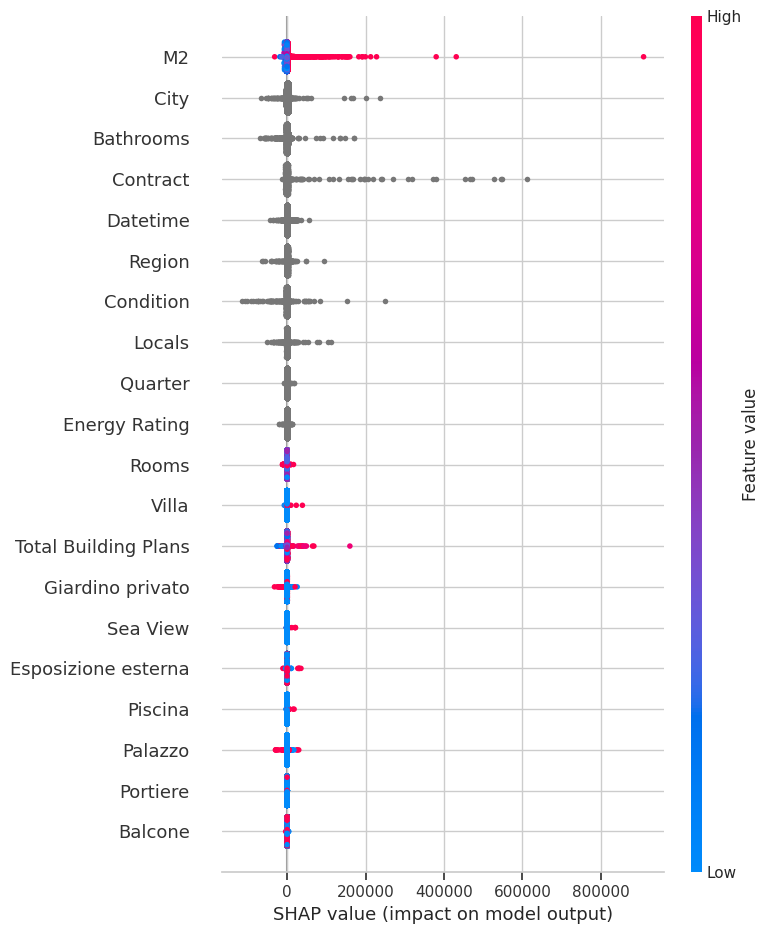

In [108]:
import shap

explainer = shap.TreeExplainer(cb)
shap_values = explainer.shap_values(data_train.drop('Price', 1))
shap.summary_plot(shap_values, data_train.drop(['Price'], 1))

In [109]:
# Extract features important in pandas form
vals = np.abs(shap_values).mean(0)
feature_names = list(train.columns)

feature_importance = pd.DataFrame(list(zip(feature_names, vals)),
                                 columns=['col_name','feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'], ascending=False, inplace=True)
feature_importance

,col_name,feature_importance_vals
1,Rooms,815.595128
7,Parking Spaces,507.512428
2,M2,496.144795
3,Bathrooms,455.358533
13,Sea View,233.339016
11,Condition,229.994416
10,Href,206.378367
4,Contract,155.168730
8,City,118.032525
51,Centralized Warming,117.628739


<Axes: title={'center': 'Feature Importance'}, ylabel='feature_importance_vals'>

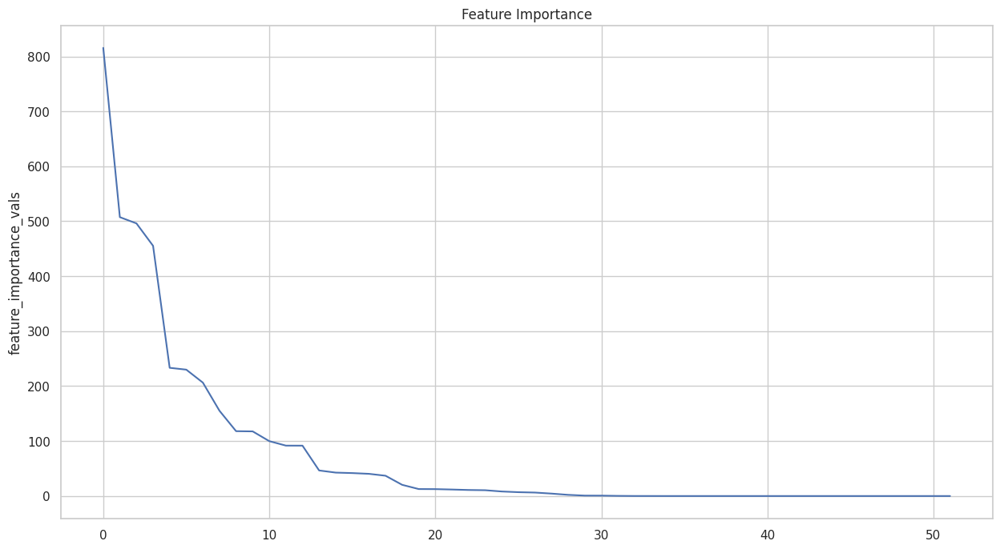

In [110]:
# Make line plot
plt.subplots(figsize=(15, 8))
plt.title('Feature Importance')
sns.set()
sns.lineplot(data=feature_importance, x=feature_importance.reset_index(0).index, y='feature_importance_vals')

In [111]:
# From the image above, select only 27 features that have a high influence on predictions
# Choose 27 because before the chart is above the blue flat line
column_importance_feat = list(feature_importance.iloc[:27,:]['col_name'].values)
column_importance_feat

['Rooms',
 'Parking Spaces',
 'M2',
 'Bathrooms',
 'Sea View',
 'Condition',
 'Href',
 'Contract',
 'City',
 'Centralized Warming',
 'Price',
 'Datetime',
 'Locals',
 'Giardino comune',
 'Region',
 'Impianto tv',
 'Portiere',
 'Villa',
 'Impianto allarme',
 'Arredato',
 'Cascina',
 'Casa',
 'Cancello elettrico',
 'Total Building Plans',
 'Terratetto',
 'Dammuso',
 'Balcone']

We will try to use column_importance_feat as the column that influences modeling. We will try it on CatBoost and then try another model (have to be feature engineering first except CatBoost can run without feature engineering because there is code cat_features=list(train_obj.columns), which can process object or categorical columns).

In [112]:
coba = data_train[column_importance_feat]
coba.head()

,Rooms,Parking Spaces,M2,Bathrooms,Sea View,Condition,Href,Contract,City,Centralized Warming,Price,Datetime,Locals,Giardino comune,Region,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone
19634,2.0,1,65.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/100032036/,"Affitto, 4+4",Settimo Torinese,1.0,550.0,2023-04-15,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",0,PIEMONTE,1,0,0,0,0,0,0,0,2.0,0,0,1
8607,4.0,0,120.0,2,0.0,Unknown,https://www.immobiliare.it/annunci/98748986/,Affitto,Bari,1.0,1200.0,2023-09-01,"4 camere da letto, 2 bagni",0,PUGLIA,0,0,0,0,1,0,0,0,5.0,0,0,1
52159,2.0,1,50.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/76688226/,"Affitto, concordato",Moncalieri,1.0,325.0,2023-05-24,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",1,PIEMONTE,1,0,0,0,0,0,0,0,2.0,0,0,1
47866,4.0,0,105.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/103232110/,Affitto,Firenze,1.0,1500.0,2023-05-17,"4 (2 camere da letto, 2 altri), 1 bagno, cucin...",0,TOSCANA,1,0,0,0,1,0,0,0,6.0,0,0,1
22345,3.0,0,60.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/55006594/,Affitto,Napoli,1.0,650.0,2023-10-02,"3 (2 camere da letto, 1 altro), 1 bagno",0,CAMPANIA,0,0,0,0,1,0,0,0,3.0,0,0,1


In [113]:
# Create a new DataFrame with the appropriate columns
# data_col_importance_train = data_train[column_importance_feat + ['Price']].copy()
# data_col_importance_test = data_test[column_importance_feat + ['Price']].copy()

data_col_importance_train = copy.deepcopy(data_train[column_importance_feat])
data_col_importance_test = copy.deepcopy(data_test[column_importance_feat])

In [114]:
data_col_importance_train.head()

,Rooms,Parking Spaces,M2,Bathrooms,Sea View,Condition,Href,Contract,City,Centralized Warming,Price,Datetime,Locals,Giardino comune,Region,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone
19634,2.0,1,65.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/100032036/,"Affitto, 4+4",Settimo Torinese,1.0,550.0,2023-04-15,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",0,PIEMONTE,1,0,0,0,0,0,0,0,2.0,0,0,1
8607,4.0,0,120.0,2,0.0,Unknown,https://www.immobiliare.it/annunci/98748986/,Affitto,Bari,1.0,1200.0,2023-09-01,"4 camere da letto, 2 bagni",0,PUGLIA,0,0,0,0,1,0,0,0,5.0,0,0,1
52159,2.0,1,50.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/76688226/,"Affitto, concordato",Moncalieri,1.0,325.0,2023-05-24,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",1,PIEMONTE,1,0,0,0,0,0,0,0,2.0,0,0,1
47866,4.0,0,105.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/103232110/,Affitto,Firenze,1.0,1500.0,2023-05-17,"4 (2 camere da letto, 2 altri), 1 bagno, cucin...",0,TOSCANA,1,0,0,0,1,0,0,0,6.0,0,0,1
22345,3.0,0,60.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/55006594/,Affitto,Napoli,1.0,650.0,2023-10-02,"3 (2 camere da letto, 1 altro), 1 bagno",0,CAMPANIA,0,0,0,0,1,0,0,0,3.0,0,0,1


In [115]:
data_col_importance_test.head()

,Rooms,Parking Spaces,M2,Bathrooms,Sea View,Condition,Href,Contract,City,Centralized Warming,Price,Datetime,Locals,Giardino comune,Region,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone
60003,4.0,1,110.0,2,0.0,Excellent/renovated,https://www.immobiliare.it/annunci/103588240/,"Affitto, libero",Fubine Monferrato,1.0,650.0,2023-01-06,"4 (2 camere da letto, 2 altri), 2 bagni, cucin...",1,PIEMONTE,1,0,0,0,1,0,0,1,3.0,0,0,1
52588,4.0,0,97.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/103375230/,Affitto,Firenze,1.0,850.0,2023-05-23,"4 (2 camere da letto, 2 altri), 1 bagno, cucin...",0,TOSCANA,0,0,0,0,0,0,0,0,10.0,0,0,1
51091,3.0,1,80.0,1,1.0,Good/habitable,https://www.immobiliare.it/annunci/103350416/,"Affitto, transitorio",Finale Ligure,1.0,5000.0,2023-05-22,"3 (2 camere da letto, 1 altro), 1 bagno, cucin...",0,LIGURIA,1,0,0,0,1,0,0,0,1.0,0,0,0
22802,4.0,0,120.0,1,0.0,Unknown,https://www.immobiliare.it/annunci/95333010/,Affitto,Ficarra,1.0,350.0,2022-04-27,"4 (2 camere da letto, 2 altri), 1 bagno, cucin...",0,SICILIA,0,0,0,0,0,0,0,0,2.0,0,0,1
51884,2.0,0,60.0,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/87443122/,"Affitto, 4+4",Settimo Torinese,1.0,550.0,2023-05-24,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",0,PIEMONTE,1,0,0,0,1,0,0,0,5.0,0,0,1


In [116]:
# Numerical
col_train_num = data_col_importance_train.select_dtypes(include=[np.float64])
# Categorical
col_train_obj = data_col_importance_train.select_dtypes(include=[np.object_])

In [117]:
# Catboost retraining with the feature importance column above
start_time = time.time()

model_cb = CatBoostRegressor()
model_cb.fit(data_col_importance_train.drop('Price', 1), data_col_importance_train['Price'], cat_features=list(col_train_obj.columns))

end_time = time.time()
elapsed_time = end_time - start_time

print('Training time:', elapsed_time, 'Second')

Learning rate set to 0.07605
0:	learn: 24920.5174293	total: 97.7ms	remaining: 1m 37s
1:	learn: 24696.7843663	total: 173ms	remaining: 1m 26s
2:	learn: 24465.3784098	total: 290ms	remaining: 1m 36s
3:	learn: 24256.6649041	total: 328ms	remaining: 1m 21s
4:	learn: 23881.5562506	total: 431ms	remaining: 1m 25s
5:	learn: 23509.2357417	total: 478ms	remaining: 1m 19s
6:	learn: 23107.7917933	total: 525ms	remaining: 1m 14s
7:	learn: 22724.3609214	total: 585ms	remaining: 1m 12s
8:	learn: 22265.2326420	total: 671ms	remaining: 1m 13s
9:	learn: 21882.3166782	total: 763ms	remaining: 1m 15s
10:	learn: 21473.3234700	total: 870ms	remaining: 1m 18s
11:	learn: 21404.3138400	total: 1s	remaining: 1m 22s
12:	learn: 21237.8359248	total: 1.1s	remaining: 1m 23s
13:	learn: 20925.8424784	total: 1.22s	remaining: 1m 25s
14:	learn: 20514.3720784	total: 1.39s	remaining: 1m 31s
15:	learn: 20336.1903349	total: 1.5s	remaining: 1m 32s
16:	learn: 20165.7129046	total: 1.68s	remaining: 1m 37s
17:	learn: 19805.3663418	total: 1

In [118]:
# Function Mean Absolute Percentage Error (MAPE)
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Function to evaluate the regression model
def evaluation_regresi(model, data_train, data_test):
    print('========== Data Test Evaluation ===========')
    y_pred_test = model.predict(data_test.drop('Price', 1))

    # R2 Score (Coefficient of Determination)
    r2 = r2_score(data_test['Price'], y_pred_test)
    print('R2 Score:', r2)

    # Mean Absolute Error (MAE)
    mae = mean_absolute_error(data_test['Price'], y_pred_test)
    print('Mean Absolute Error:', mae)

    # Mean Squared Error (MSE)
    mse = mean_squared_error(data_test['Price'], y_pred_test)
    print('Mean Squared Error:', mse)

    mape = mean_absolute_percentage_error(data_test['Price'], y_pred_test)
    print('Mean Absolute Percentage Error:', mape)

    print('========== Data Train Evaluation ===========')
    y_pred_train = model.predict(data_train.drop('Price', 1))

    # R2 Score (Coefficient of Determination)
    r2_train = r2_score(data_train['Price'], y_pred_train)
    print('R2 Score:', r2_train)

    # Mean Absolute Error (MAE)
    mae_train = mean_absolute_error(data_train['Price'], y_pred_train)
    print('Mean Absolute Error:', mae_train)

    # Mean Squared Error (MSE)
    mse_train = mean_squared_error(data_train['Price'], y_pred_train)
    print('Mean Squared Error:', mse_train)

    mape_train = mean_absolute_percentage_error(data_train['Price'], y_pred_train)
    print('Mean Absolute Percentage Error:', mape_train)

In [119]:
# Use the evaluation_regresi function with the appropriate model
evaluation_regresi(model_cb,data_col_importance_train, data_col_importance_test)

========== Data Test Evaluation ===========
R2 Score: 0.021175638978858546
Mean Absolute Error: 2297.3187176317133
Mean Squared Error: 12726290742.785929
Mean Absolute Percentage Error: 375.2528341588171
========== Data Train Evaluation ===========
R2 Score: 0.7564239967673619
Mean Absolute Error: 1036.9307053477146
Mean Squared Error: 156175190.98465404
Mean Absolute Percentage Error: 458.672635232197


`R2 Score:` The results of R2 Score indicate that the model has a low ability to explain variations in the test data (before and after feature selection). A low R2 score in the test data may indicate that the model does not match the test data or that the important information in the test data cannot be recognized properly by the model.

`Mean Absolute Error (MAE):` MAE measures the average deviation between the model's predictions and the true value. The lower the MAE value, the better the model performance. We noted an increase in the MAE in the test data after feature selection, which indicates that the model may not be able to predict prices accurately on the test data.

`Mean Squared Error (MSE):` MSE measures the squared deviation between a model's prediction and the true value. The lower the MSE value, the better the model performance. We also noted an increase in MSE on the test data after feature selection.

`Mean Absolute Percentage Error (MAPE):` MAPE measures the average percentage deviation between the model's predictions and the true value. A high MAPE value, as we will find, may indicate that the model has significant error in predicting prices.

Comparison of Train Data and Test Data: It can be seen that the model performs better on the training data (higher R2 value and lower error). **This is an indication of overfitting.**

Let's try another model and do feature engineering of data_col_importance_train and data_col_importance_test!

## Feature Engineering

### Outlier Handling

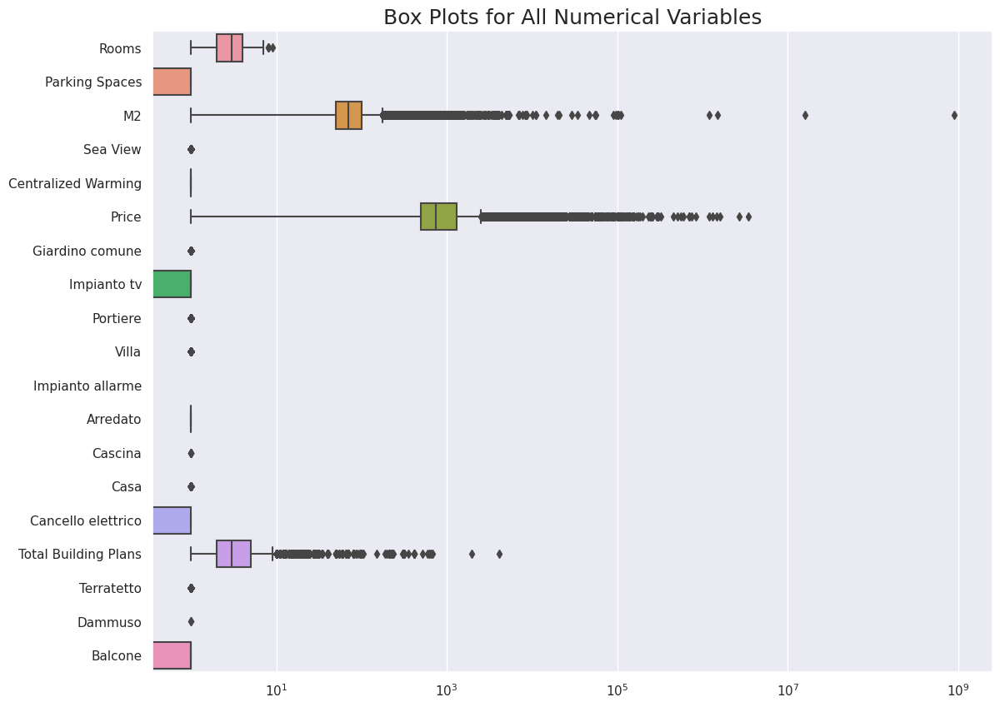

In [120]:
# Plotting Boxplots of the numerical features
plt.figure(figsize = (13,10))
ax = sns.boxplot(data = data_col_importance_train, orient='h')
ax.set_title('Box Plots for All Numerical Variables', fontsize = 18)
ax.set(xscale='log')

plt.show()

In [121]:
def remove_outliers_iqr(dataframe, columns, threshold=1.5):
    '''
    Removing outliers from the dataframe using the IQR technique.

    Parameters:
        dataframe (DataFrame): DataFrame to remove the outliers from.
        columns (list): List of columns to remove the outliers from.
        threshold (float): IQR factor to identify outliers. Default 1.5.

    Returns:
        DataFrame: New DataFrame without any outliers.
    '''
    df_no_outliers = copy.deepcopy(dataframe)

    for col in columns:
        Q1 = df_no_outliers[col].quantile(0.25)
        Q3 = df_no_outliers[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR

        df_no_outliers = df_no_outliers[(df_no_outliers[col] >= lower_bound) & (df_no_outliers[col] <= upper_bound)]

    return df_no_outliers

In [122]:
# The numeric field you want to remove the outlier from
col_train_num = data_col_importance_train.select_dtypes(include=[np.float64])
outlier_columns = col_train_num.columns

# Remove outliers on the train data and test data
data_col_importance_train_no_outliers = remove_outliers_iqr(data_col_importance_train, outlier_columns)
data_col_importance_test_no_outliers = remove_outliers_iqr(data_col_importance_test, outlier_columns)

# Show number of lines before and after removing outliers
print('Number of data_col_importance_train rows before removing outliers:', len(data_col_importance_train))
print('Number of data_col_importance_train rows after removing outliers:', len(data_col_importance_train_no_outliers))

print('Data_col_importance_test row count before removing outliers:', len(data_col_importance_test))
print('Data_col_importance_test row count after removing outliers:', len(data_col_importance_test_no_outliers))

Number of data_col_importance_train rows before removing outliers: 50352
Number of data_col_importance_train rows after removing outliers: 42245
Data_col_importance_test row count before removing outliers: 12589
Data_col_importance_test row count after removing outliers: 10594


### Feature Scalling

In [123]:
data_col_importance_train_no_outliers.describe()

,Rooms,Parking Spaces,M2,Sea View,Centralized Warming,Price,Giardino comune,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone
count,42245.000000,42245.000000,42245.000000,42245.0,42245.0,42245.000000,42245.000000,42245.000000,42245.000000,42245.000000,42245.0,42245.000000,42245.000000,42245.000000,42245.000000,42245.000000,42245.000000,42245.0,42245.000000
mean,2.663297,0.356184,72.640715,0.0,1.0,818.957060,0.174648,0.592117,0.134975,0.024311,0.0,0.764185,0.000118,0.001468,0.249805,3.457214,0.012143,0.0,0.505764
std,1.082817,0.478876,30.750177,0.0,0.0,438.810232,0.379670,0.491447,0.341700,0.154013,0.0,0.424512,0.010879,0.038282,0.432905,1.773378,0.109527,0.0,0.499973
min,1.000000,0.000000,1.000000,0.0,1.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,0.000000
25%,2.000000,0.000000,50.000000,0.0,1.0,500.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.0,0.000000
50%,3.000000,0.000000,70.000000,0.0,1.0,700.000000,0.000000,1.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.0,1.000000
75%,3.000000,1.000000,90.000000,0.0,1.0,1000.000000,0.000000,1.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.0,1.000000
max,6.000000,1.000000,175.000000,0.0,1.0,2250.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,9.000000,1.000000,0.0,1.000000


From the description above, the value with the most different scale is column M2. Do Feature Scalling in the column.

In [124]:
from sklearn.preprocessing import StandardScaler

# Column 'M2' in data_col_importance_train_no_outliers
col_train_m2 = data_col_importance_train_no_outliers[['M2']]
col_test_m2 = data_col_importance_test_no_outliers[['M2']]

# Initialize StandardScaler
scaler = StandardScaler()

# Fit scaler on train data and transformation of train and test data
col_train_m2_scaled = scaler.fit_transform(col_train_m2)
col_test_m2_scaled = scaler.transform(col_test_m2)

# Change column value 'M2' which has been scaled in DataFrame
data_col_importance_train_no_outliers['M2'] = col_train_m2_scaled
data_col_importance_test_no_outliers['M2'] = col_test_m2_scaled

In [125]:
# Display the result of multiple rows of data after scaling
print('Data train after scaling:')
data_col_importance_train_no_outliers.head(1)

Data train after scaling:


,Rooms,Parking Spaces,M2,Bathrooms,Sea View,Condition,Href,Contract,City,Centralized Warming,Price,Datetime,Locals,Giardino comune,Region,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone
19634,2.0,1,-0.24848,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/100032036/,"Affitto, 4+4",Settimo Torinese,1.0,550.0,2023-04-15,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",0,PIEMONTE,1,0,0,0,0,0,0,0,2.0,0,0,1


In [126]:
print('Test data after scaling:')
data_col_importance_test_no_outliers.head()

Test data after scaling:


,Rooms,Parking Spaces,M2,Bathrooms,Sea View,Condition,Href,Contract,City,Centralized Warming,Price,Datetime,Locals,Giardino comune,Region,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone
60003,4.0,1,1.214943,2,0.0,Excellent/renovated,https://www.immobiliare.it/annunci/103588240/,"Affitto, libero",Fubine Monferrato,1.0,650.0,2023-01-06,"4 (2 camere da letto, 2 altri), 2 bagni, cucin...",1,PIEMONTE,1,0,0,0,1,0,0,1,3.0,0,0,1
22802,4.0,0,1.540149,1,0.0,Unknown,https://www.immobiliare.it/annunci/95333010/,Affitto,Ficarra,1.0,350.0,2022-04-27,"4 (2 camere da letto, 2 altri), 1 bagno, cucin...",0,SICILIA,0,0,0,0,0,0,0,0,2.0,0,0,1
51884,2.0,0,-0.411083,1,0.0,Good/habitable,https://www.immobiliare.it/annunci/87443122/,"Affitto, 4+4",Settimo Torinese,1.0,550.0,2023-05-24,"2 (1 camera da letto, 1 altro), 1 bagno, cucin...",0,PIEMONTE,1,0,0,0,1,0,0,0,5.0,0,0,1
37351,3.0,0,-0.085877,1,0.0,Excellent/renovated,https://www.immobiliare.it/annunci/90500627/,Affitto,Agrigento,1.0,500.0,2023-02-17,"3 (1 camera da letto, 2 altri), 1 bagno",0,SICILIA,0,0,0,0,1,0,0,0,1.0,0,0,1
31905,3.0,0,-0.248480,1,0.0,Excellent/renovated,https://www.immobiliare.it/annunci/102937830/,"Affitto, libero",Milano,1.0,1550.0,2023-06-05,"3 (2 camere da letto, 1 altro), 1 bagno, cucin...",1,LOMBARDIA,1,1,0,0,1,0,0,1,5.0,0,0,1


### Encoding

In [127]:
for column in data_col_importance_train_no_outliers.columns:
    value_counts = data_col_importance_train_no_outliers[column].value_counts()
    print(f"Value Counts for column '{column}':")
    print(value_counts)
    print('='*30)

Streaming output truncated to the last 5000 lines.
Biella                                 90
Forlì                                  90
Salerno                                89
Pinerolo                               87
Moncalieri                             85
Riccione                               84
Pomezia                                84
Urbino                                 84
Rimini                                 81
Ragusa                                 80
Sestriere                              78
Livorno                                78
Brescia                                77
Chieti                                 75
Spoleto                                75
Monza                                  74
Chieri                                 73
Bagheria                               73
Bolzano                                72
Lanciano                               70
Loano                                  69
Viterbo                                66
Jesi                     

From the results of the value counts above, there are several things that are of concern to encoding.
1. Before encoding, drop the Href and Locals columns because they are too cardinality (many values in 1 column and difficult to extract)
2. Drop the Sea View column because its value is constant
3. Checking rare labels: Bathrooms, Contract, City, Region -> select the threshold for only 5 labels, the rest become other labels then do frequent encoding in the Bathrooms, Contract, City, Region column
4. Extract Day from the Datetime column then drop the Datetime column
5. Frequent encoding : Rooms, Conditions, Day, Total Building Plans

In [128]:
# Step 1 and 2: Drop Href, Locals, and Sea View columns
data_col_importance_train_no_outliers = data_col_importance_train_no_outliers.drop(['Href', 'Locals', 'Sea View'], axis=1)
data_col_importance_test_no_outliers = data_col_importance_test_no_outliers.drop(['Href', 'Locals', 'Sea View'], axis=1)

In [129]:
# Step 3: Checking and frequent encoding
rare_threshold = 5  # Threshold to identify rare labels

for column in ['Bathrooms', 'Contract', 'City', 'Region']:
    value_counts = data_col_importance_train_no_outliers[column].value_counts()
    rare_labels = value_counts[value_counts <= rare_threshold].index.tolist()

    data_col_importance_train_no_outliers.loc[data_col_importance_train_no_outliers[column].isin(rare_labels), column] = 'Other'
    data_col_importance_test_no_outliers.loc[data_col_importance_test_no_outliers[column].isin(rare_labels), column] = 'Other'

# Frequent encoding
for column in ['Bathrooms', 'Contract', 'City', 'Region']:
    freq_encoder = data_col_importance_train_no_outliers[column].value_counts().to_dict()
    data_col_importance_train_no_outliers[column] = data_col_importance_train_no_outliers[column].map(freq_encoder)
    data_col_importance_test_no_outliers[column] = data_col_importance_test_no_outliers[column].map(freq_encoder)

#### Additional engineering processing features


Do frequent encoding on the Condition and Day Columns.


Notes: Rooms and Total Building are used as real values only, because they represent numbers, but bathrooms are left alone because there are values other than numbers in that column.

In [130]:
# Convert 'Datetime' column to datetime data type
data_col_importance_train_no_outliers['Datetime'] = pd.to_datetime(data_col_importance_train_no_outliers['Datetime'])
data_col_importance_test_no_outliers['Datetime'] = pd.to_datetime(data_col_importance_test_no_outliers['Datetime'])

# Step 4: Extract the day from the Datetime column and drop the Datetime column
data_col_importance_train_no_outliers['Day'] = data_col_importance_train_no_outliers['Datetime'].dt.day
data_col_importance_test_no_outliers['Day'] = data_col_importance_test_no_outliers['Datetime'].dt.day

# Drop Datetime column
data_col_importance_train_no_outliers = data_col_importance_train_no_outliers.drop(['Datetime'], axis=1)
data_col_importance_test_no_outliers = data_col_importance_test_no_outliers.drop(['Datetime'], axis=1)

# Frequent encoding for Day
freq_encoder_day = data_col_importance_train_no_outliers['Day'].value_counts().to_dict()
data_col_importance_train_no_outliers['Day'] = data_col_importance_train_no_outliers['Day'].map(freq_encoder_day)
data_col_importance_test_no_outliers['Day'] = data_col_importance_test_no_outliers['Day'].map(freq_encoder_day)

In [131]:
# Step 5: Ordinal encoding on Condition column

ordinal_encoding = {
    'Excellent/renovated': 4,
    'Good/habitable': 3,
    'New/under construction': 2,
    'To be restructured': 1,
    'Unknown': 0
}

data_col_importance_train_no_outliers['Condition'] = data_col_importance_train_no_outliers['Condition'].map(ordinal_encoding)
data_col_importance_test_no_outliers['Condition'] = data_col_importance_test_no_outliers['Condition'].map(ordinal_encoding)

In [133]:
data_col_importance_train_no_outliers.Condition.value_counts()

4    23185
3    14733
0     2637
2     1446
1      244
Name: Condition, dtype: int64

In [134]:
# Display results of multiple rows of data after preprocessing
print('Train data after preprocessing:')
data_col_importance_train_no_outliers.head()

Train data after preprocessing:


,Rooms,Parking Spaces,M2,Bathrooms,Condition,Contract,City,Centralized Warming,Price,Giardino comune,Region,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone,Day
19634,2.0,1,-0.248480,33218,3,7565,49,1.0,550.0,0,5800,1,0,0,0,0,0,0,0,2.0,0,0,1,1374
8607,4.0,0,1.540149,8185,0,15915,180,1.0,1200.0,0,1302,0,0,0,0,1,0,0,0,5.0,0,0,1,267
52159,2.0,1,-0.736288,33218,3,1914,85,1.0,325.0,1,5800,1,0,0,0,0,0,0,0,2.0,0,0,1,1634
47866,4.0,0,1.052341,33218,3,15915,665,1.0,1500.0,0,1923,1,0,0,0,1,0,0,0,6.0,0,0,1,1588
22345,3.0,0,-0.411083,33218,3,15915,916,1.0,650.0,0,3057,0,0,0,0,1,0,0,0,3.0,0,0,1,604


In [135]:
print('Test data after pre-processing:')
data_col_importance_test_no_outliers.head()

Test data after pre-processing:


,Rooms,Parking Spaces,M2,Bathrooms,Condition,Contract,City,Centralized Warming,Price,Giardino comune,Region,Impianto tv,Portiere,Villa,Impianto allarme,Arredato,Cascina,Casa,Cancello elettrico,Total Building Plans,Terratetto,Dammuso,Balcone,Day
60003,4.0,1,1.214943,8185.0,4,6687.0,4591.0,1.0,650.0,1,5800,1,0,0,0,1,0,0,1,3.0,0,0,1,774
22802,4.0,0,1.540149,33218.0,0,15915.0,4591.0,1.0,350.0,0,2722,0,0,0,0,0,0,0,0,2.0,0,0,1,1829
51884,2.0,0,-0.411083,33218.0,3,7565.0,49.0,1.0,550.0,0,5800,1,0,0,0,1,0,0,0,5.0,0,0,1,1634
37351,3.0,0,-0.085877,33218.0,4,15915.0,46.0,1.0,500.0,0,2722,0,0,0,0,1,0,0,0,1.0,0,0,1,1588
31905,3.0,0,-0.248480,33218.0,4,6687.0,3937.0,1.0,1550.0,1,5869,1,1,0,0,1,0,0,1,5.0,0,0,1,8652


###Calculate VIF and Multicollinearity Check

VIF is one of the feature selection methods, so we have to convert existing data into numerical values through the feature engineering process first, except when we do feature selection on CatBoost.

In [136]:
# Calculate VIF scores
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from statsmodels.tools.tools import add_constant

X = add_constant(data_col_importance_train_no_outliers)

vif_df = pd.DataFrame([vif(X.values, i)
               for i in range(X.shape[1])],
              index=X.columns).reset_index()
vif_df.columns = ['Features','VIF_Score']
vif_df = vif_df.loc[vif_df.Features!='const']
vif_df

,Features,VIF_Score
0,Rooms,2.603540
1,Parking Spaces,1.226634
2,M2,3.059443
3,Bathrooms,1.476143
4,Condition,1.111103
5,Contract,1.395993
6,City,1.269085
7,Centralized Warming,65.109454
8,Price,1.407957
9,Giardino comune,1.109517


VIF has a value of NaN if the following conditions exist.
1. It could be a constant value in a column (only has one unique value).
2. The effect of One Hot Encoding, is a new column due to categorical values in a column containing only 1 and 0 so that the VIF becomes NaN.
3. The value is only 0 or NaN or none (in a column).

In [137]:
# Check value counts of NaN in VIF score
data_col_importance_train_no_outliers['Impianto allarme'].value_counts()

0    42245
Name: Impianto allarme, dtype: int64

In [138]:
# Check value counts of NaN in VIF score
data_col_importance_train_no_outliers['Dammuso'].value_counts()

0    42245
Name: Dammuso, dtype: int64

In [139]:
# Drop constant values columns and VIF score above 4 (train data)
data_col_importance_train_no_outliers = data_col_importance_train_no_outliers.drop(['Centralized Warming', 'Impianto allarme', 'Dammuso'], axis=1)

# Drop also in test data
data_col_importance_test_no_outliers = data_col_importance_test_no_outliers.drop(['Centralized Warming', 'Impianto allarme', 'Dammuso'], axis=1)

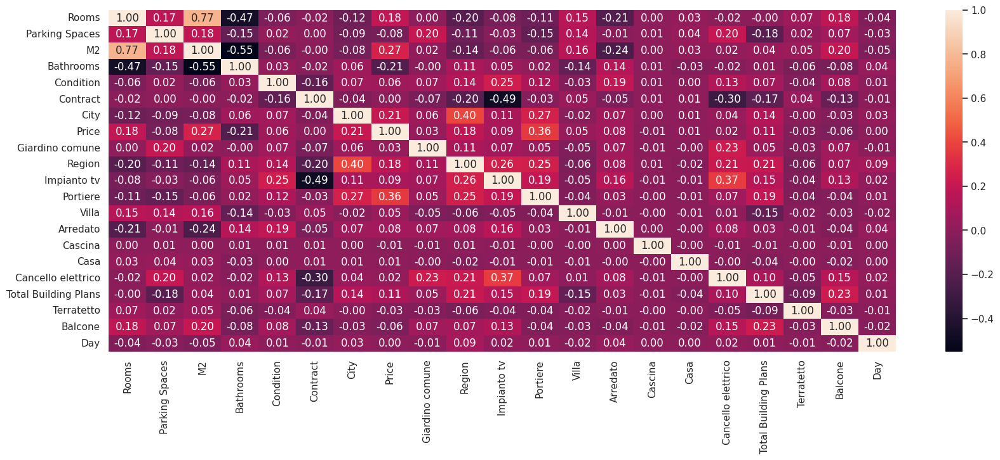

In [140]:
# Check heatmap correlation
df_train = pd.concat([data_col_importance_train_no_outliers], axis=1)
corr = df_train.corr()

plt.figure(figsize=(20,7))
sns.heatmap(corr, annot=True, fmt='.2f')
plt.show()

### Do the modeling for the two datasets above!

In [141]:
list(data_col_importance_test_no_outliers.columns)

['Rooms',
 'Parking Spaces',
 'M2',
 'Bathrooms',
 'Condition',
 'Contract',
 'City',
 'Price',
 'Giardino comune',
 'Region',
 'Impianto tv',
 'Portiere',
 'Villa',
 'Arredato',
 'Cascina',
 'Casa',
 'Cancello elettrico',
 'Total Building Plans',
 'Terratetto',
 'Balcone',
 'Day']

In [142]:
# Select the columns we want to use as features
selected_columns = ['Rooms',
 'Parking Spaces',
 'M2',
 'Bathrooms',
 'Condition',
 'Contract',
 'City',
 'Giardino comune',
 'Region',
 'Impianto tv',
 'Portiere',
 'Villa',
 'Arredato',
 'Cascina',
 'Casa',
 'Cancello elettrico',
 'Total Building Plans',
 'Terratetto',
 'Balcone',
 'Day']

# Data Train
Xtrain = data_col_importance_train_no_outliers[selected_columns]
ytrain = data_col_importance_train_no_outliers['Price']

# Data Test
Xtest = data_col_importance_test_no_outliers[selected_columns]
ytest = data_col_importance_test_no_outliers['Price']

In [143]:
Xtrain.isna().sum()
# Nice! There's no missing values.

Rooms                   0
Parking Spaces          0
M2                      0
Bathrooms               0
Condition               0
Contract                0
City                    0
Giardino comune         0
Region                  0
Impianto tv             0
Portiere                0
Villa                   0
Arredato                0
Cascina                 0
Casa                    0
Cancello elettrico      0
Total Building Plans    0
Terratetto              0
Balcone                 0
Day                     0
dtype: int64

In [144]:
Xtest.isna().sum()
'''There are missing values.
Just drop it, because the test data represents the test data,
but if a missing value appears in the train data,
then process it again with the median or mode of the train data.'''

'There are missing values.\nJust drop it, because the test data represents the test data,\nbut if a missing value appears in the train data,\nthen process it again with the median or mode of the train data.'

In [145]:
# Display the contents of the 'City' column containing NaNs in Xtest
city_nan = Xtest[Xtest['City'].isna()]['City']
print('City column with NaN values in Xtest:')
print(city_nan)

# Display the contents of the 'Contract' column containing NaNs in Xtest
contract_nan = Xtest[Xtest['Contract'].isna()]['Contract']
print('Contract column with NaN values in Xtest:')
print(contract_nan)

# Display the contents of the column 'Bathrooms' containing NaN in Xtest
bathrooms_nan = Xtest[Xtest['Bathrooms'].isna()]['Bathrooms']
print('\nBathrooms column with NaN values in Xtest:')
print(bathrooms_nan)

City column with NaN values in Xtest:
54026   NaN
25773   NaN
54157   NaN
45477   NaN
14446   NaN
17278   NaN
56507   NaN
33129   NaN
56695   NaN
33680   NaN
36673   NaN
50738   NaN
32617   NaN
8913    NaN
45668   NaN
32068   NaN
27442   NaN
50168   NaN
13094   NaN
42620   NaN
25133   NaN
2574    NaN
2558    NaN
17571   NaN
32842   NaN
25638   NaN
17521   NaN
14127   NaN
182     NaN
40295   NaN
14283   NaN
39372   NaN
31137   NaN
26079   NaN
33096   NaN
52155   NaN
14521   NaN
9845    NaN
36921   NaN
16812   NaN
36852   NaN
20570   NaN
31785   NaN
25684   NaN
51367   NaN
32660   NaN
13150   NaN
40520   NaN
25045   NaN
40596   NaN
3753    NaN
39947   NaN
31995   NaN
1566    NaN
42266   NaN
33353   NaN
60562   NaN
33855   NaN
18553   NaN
8251    NaN
47679   NaN
54950   NaN
3789    NaN
27845   NaN
6165    NaN
39333   NaN
42150   NaN
47678   NaN
59920   NaN
58115   NaN
59106   NaN
51525   NaN
13556   NaN
45843   NaN
30751   NaN
26043   NaN
22096   NaN
36718   NaN
40236   NaN
11903   NaN
16

In [146]:
# Remove rows with value NaN from 'City', 'Contract' and 'Bathrooms' columns in Xtest
# Remove rows with value NaN from 'City', 'Contract' and 'Bathrooms' columns in Xtest and ytest
Xtest = Xtest.dropna(subset=['City', 'Bathrooms', 'Contract'])
ytest = ytest[Xtest.index]
Xtest.isna().sum()

Rooms                   0
Parking Spaces          0
M2                      0
Bathrooms               0
Condition               0
Contract                0
City                    0
Giardino comune         0
Region                  0
Impianto tv             0
Portiere                0
Villa                   0
Arredato                0
Cascina                 0
Casa                    0
Cancello elettrico      0
Total Building Plans    0
Terratetto              0
Balcone                 0
Day                     0
dtype: int64

# Modelling

In [147]:
ytrain.shape

(42245,)

In [148]:
Xtrain.shape

(42245, 20)

In [149]:
ytest.shape

(10326,)

In [150]:
Xtest.shape

(10326, 20)

In [151]:
# Function for showing the modelling results
def my_modeling(X_train, X_test, y_train, y_test):
    list_model = [
        LinearRegression(),
        DecisionTreeRegressor(random_state=42),
        RandomForestRegressor(random_state=42),
        GradientBoostingRegressor(random_state=42),
        xgb.XGBRegressor(random_state=42),
        lightgbm.LGBMRegressor(random_state=42),
        CatBoostRegressor(random_state=42, verbose=False),
        Ridge(alpha=0.1, random_state=42),
        Lasso(alpha=0.1, random_state=42)
    ]

    Evaluation_train = pd.DataFrame(columns=['Method', 'R^2', 'MAE', 'MSE', 'MAPE', 'RMSE'])
    Evaluation_test = pd.DataFrame(columns=['Method', 'R^2', 'MAE', 'MSE', 'MAPE', 'RMSE'])

    for model in list_model:
        model.fit(X_train, y_train)
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)
        method = str(type(model)).split('.')[-1][:-2]

        # Score it for train set
        R2_train = metrics.explained_variance_score(y_train, y_pred_train)
        MAE_train = metrics.mean_absolute_error(y_train, y_pred_train)
        MSE_train = metrics.mean_squared_error(y_train, y_pred_train)
        MAPE_train = mean_absolute_percentage_error(y_train, y_pred_train)
        RMSE_train = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))

        # Score it for test set
        R2_test = metrics.explained_variance_score(y_test, y_pred_test)
        MAE_test = metrics.mean_absolute_error(y_test, y_pred_test)
        MSE_test = metrics.mean_squared_error(y_test, y_pred_test)
        MAPE_test = mean_absolute_percentage_error(y_test, y_pred_test)
        RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))

        Evaluation_train = Evaluation_train.append({'Method': method,
                                                   'R^2': R2_train,
                                                   'MAE': MAE_train,
                                                   'MSE': MSE_train,
                                                   'MAPE': MAPE_train,
                                                   'RMSE': RMSE_train},
                                                  ignore_index=True)

        Evaluation_test = Evaluation_test.append({'Method': method,
                                                 'R^2': R2_test,
                                                 'MAE': MAE_test,
                                                 'MSE': MSE_test,
                                                 'MAPE': MAPE_test,
                                                 'RMSE': RMSE_test},
                                                ignore_index=True)

    return Evaluation_train, Evaluation_test

## Baseline Model

In [152]:
# Call the my_modeling function with split data for baseline
evaluation_train_result_base, evaluation_test_result_base = my_modeling(X_train_base, X_test_base, y_train_base, y_test_base)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759
[LightGBM] [Info] Number of data points in the train set: 5784, number of used features: 27
[LightGBM] [Info] Start training from score 1314.149723


In [153]:
# Show evaluation baseline results for each model and both (train and test)
print('Evaluation Baseline on Train Data:')
evaluation_train_result_base

Evaluation Baseline on Train Data:


,Method,R^2,MAE,MSE,MAPE,RMSE
0,LinearRegression,0.275033,583.150333,2.385677e+06,55.078068,1544.563635
1,DecisionTreeRegressor,0.995633,3.895977,1.436990e+04,0.073543,119.874517
2,RandomForestRegressor,0.903251,155.836789,3.185330e+05,15.682238,564.387299
3,GradientBoostingRegressor,0.664780,424.010408,1.103123e+06,47.406957,1050.296451
4,XGBRegressor,0.966769,174.988829,1.093545e+05,20.124844,330.687858
5,LGBMRegressor,0.737767,342.707556,8.629391e+05,34.059893,928.945181
6,CatBoostRegressor,0.908928,276.463207,2.996939e+05,30.588141,547.443089
7,Ridge,0.275033,583.146671,2.385679e+06,55.077113,1544.564341
8,Lasso,0.274983,582.926416,2.385843e+06,55.022157,1544.617525


In [154]:
print('Evaluation Baseline on Test Data:')
evaluation_test_result_base

Evaluation Baseline on Test Data:


,Method,R^2,MAE,MSE,MAPE,RMSE
0,LinearRegression,0.105394,556.105733,4.347362e+06,50.155885,2085.032945
1,DecisionTreeRegressor,0.005013,457.661365,4.826508e+06,36.450459,2196.931608
2,RandomForestRegressor,0.210747,384.182864,3.829640e+06,32.537964,1956.946518
3,GradientBoostingRegressor,0.178405,462.706658,3.986783e+06,41.668979,1996.692916
4,XGBRegressor,0.177508,421.746753,3.989925e+06,36.157374,1997.479550
5,LGBMRegressor,0.188879,443.711950,3.934900e+06,36.689380,1983.658249
6,CatBoostRegressor,0.243784,416.423478,3.668334e+06,35.754218,1915.289422
7,Ridge,0.105411,556.091716,4.347277e+06,50.154004,2085.012470
8,Lasso,0.105482,555.767004,4.346900e+06,50.100194,2084.922089


## Model Improvement

In [155]:
# Call the my_modeling function with split data
evaluation_train_result, evaluation_test_result = my_modeling(Xtrain, Xtest, ytrain, ytest)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 422
[LightGBM] [Info] Number of data points in the train set: 42245, number of used features: 19
[LightGBM] [Info] Start training from score 818.957060


In [156]:
# Show evaluation results for each model and both (train and test)
print('Evaluation on Train Data:')
evaluation_train_result

Evaluation on Train Data:


,Method,R^2,MAE,MSE,MAPE,RMSE
0,LinearRegression,0.289751,277.590764,136758.338445,120.667597,369.808516
1,DecisionTreeRegressor,0.990544,5.652210,1820.750080,0.502321,42.670248
2,RandomForestRegressor,0.936778,72.384861,12194.202655,38.316748,110.427364
3,GradientBoostingRegressor,0.518339,215.103216,92743.799021,107.537238,304.538666
4,XGBRegressor,0.703547,164.857811,57081.941682,86.378694,238.918274
5,LGBMRegressor,0.617518,188.116392,73646.827404,102.502849,271.379490
6,CatBoostRegressor,0.664205,175.744989,64657.327349,92.988677,254.278051
7,Ridge,0.289751,277.590827,136758.350678,120.669717,369.808532
8,Lasso,0.289577,277.631517,136791.831974,120.661318,369.853798


In [157]:
print('Evaluation on Test Data:')
evaluation_test_result

Evaluation on Test Data:


,Method,R^2,MAE,MSE,MAPE,RMSE
0,LinearRegression,0.299360,272.132357,131608.987427,110.649867,362.779530
1,DecisionTreeRegressor,0.218962,247.085987,146874.473832,122.076246,383.242056
2,RandomForestRegressor,0.611936,184.388363,73019.854585,91.466575,270.221862
3,GradientBoostingRegressor,0.519949,213.378952,90172.618457,98.739759,300.287560
4,XGBRegressor,0.610903,186.871553,73083.395538,95.283071,270.339408
5,LGBMRegressor,0.596835,192.150279,75725.043649,97.318166,275.181837
6,CatBoostRegressor,0.619644,185.941007,71444.360039,95.947661,267.290778
7,Ridge,0.299360,272.132211,131608.972045,110.649589,362.779509
8,Lasso,0.299321,272.142298,131617.006980,110.504837,362.790583


In the case of predicting house or property prices, the choice of evaluation metric depends on the purpose and context in which our model is used. Here are some metrics that are commonly used in this case:

    1. R^2 (Coefficient of Determination): This metric measures how well the variation in the target variable (house prices) can be explained by the model. R^2 values range between 0 and 1, with higher values indicating that the model is able to account for greater variation in the data. However, R^2 is not sensitive to significant differences between the actual value and the predicted value.

    2. Mean Absolute Error (MAE): MAE measures the average absolute error between the actual value and the predicted value. MAE gives an idea of how big the average error is in predicting house prices. MAE is easier to interpret because the error is measured in the same units as the target variable.

    3. Mean Absolute Percentage Error (MAPE): MAPE measures the average absolute percentage error between the actual value and the predicted value compared to the actual value. MAPE provides information about how far the prediction can be wrong in percentage of the actual value.

    4. Root Mean Squared Error (RMSE): RMSE measures the root mean of the squared error between the actual value and the predicted value. RMSE tends to give greater weight to predicted values that are far from actual values, so large errors have a more significant impact.

The choice of metric depends on our priorities:

    1. If we want to measure how well your model accounts for variations in house prices, R^2 is a useful metric.
    2. If we want to evaluate the mean error rate in predicted values, MAE is a good choice.
    3. If we want to measure the error as a percentage of the actual value, MAPE is a good choice.
    4. If we want to measure the error in the same units as the target variable and have more impact on the prediction of significance, RMSE is a good choice.

In practice, it's often better to use multiple metrics together to get a complete picture of how our model is performing. The choice of metric depends on the business context and our preference for the desired error rate.

From the results and discussion above, it can be considered to choose the **CatBoostRegressor and XGBoostRegressor** models as the best models.

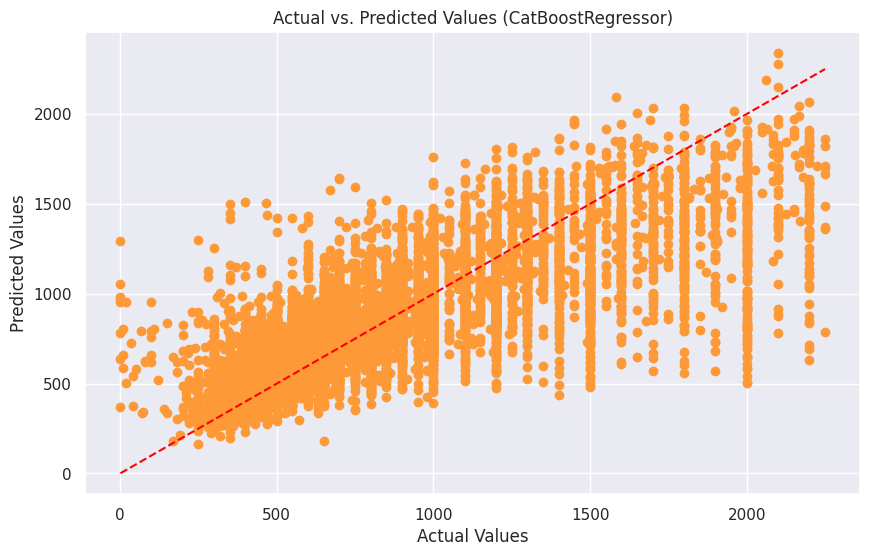

In [158]:
# Fit model
model = CatBoostRegressor(random_state=42, verbose=False)
model.fit(Xtrain, ytrain)
y_pred_train = model.predict(Xtrain)
y_pred_test = model.predict(Xtest)

# Assuming y_test contains the actual target values and y_pred contains the predicted values
plt.figure(figsize=(10, 6))
plt.scatter(ytest, y_pred_test, color='#fd9a37')
plt.plot([min(ytest), max(ytest)], [min(ytest), max(ytest)], color='red', linestyle='--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (CatBoostRegressor)')
plt.show()

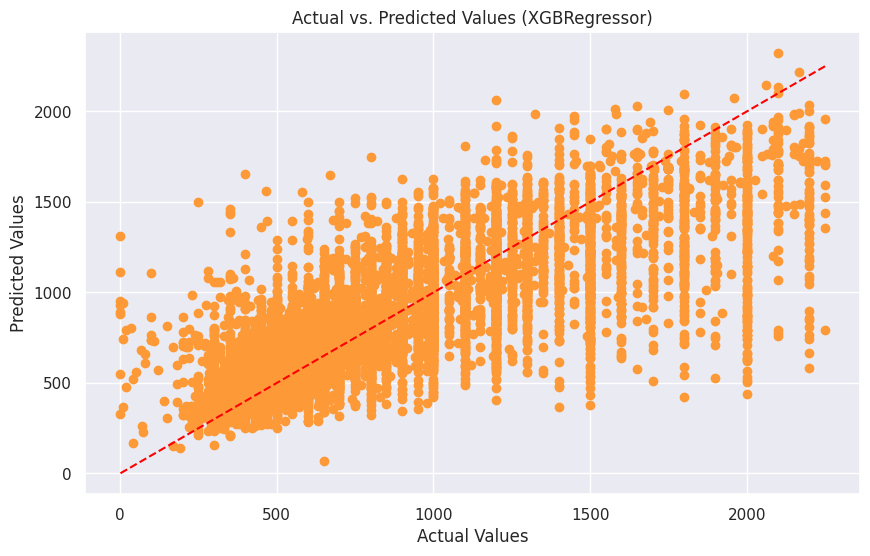

In [159]:
# Fit model
model = xgb.XGBRegressor(random_state=42)
model.fit(Xtrain, ytrain)
y_pred_train = model.predict(Xtrain)
y_pred_test = model.predict(Xtest)

# Assuming y_test contains the actual target values and y_pred contains the predicted values
plt.figure(figsize=(10, 6))
plt.scatter(ytest, y_pred_test, color='#fd9a37')
plt.plot([min(ytest), max(ytest)], [min(ytest), max(ytest)], color='red', linestyle='--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (XGBRegressor)')
plt.show()

# Diagnostic Study

In [160]:
from sklearn.metrics import r2_score

model = CatBoostRegressor(random_state=42, verbose=False)
model.fit(Xtrain, ytrain)
y_pred_train = model.predict(Xtrain)

# Score it for train set
print('R-squared for training data is {}'.format(r2_score(ytrain, y_pred_train)))

R-squared for training data is 0.6642047575803045


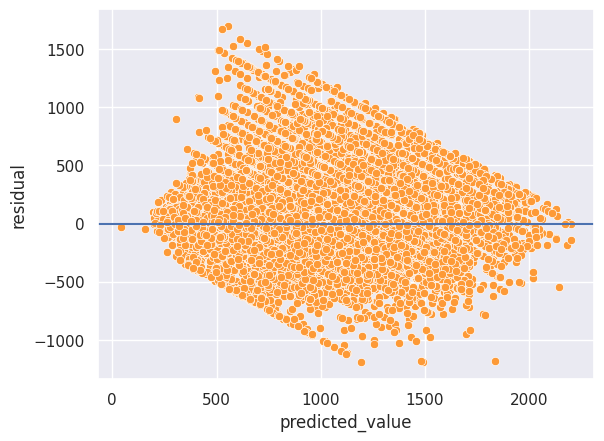

In [166]:
# Calculate residuals
residual = ytrain - y_pred_train

# Prepare dataframe
# 1 predictor --> predictor VS residual
df_resid = pd.DataFrame({
    'predicted_value': y_pred_train,
    'residual': residual
})

# Residual plot
sns.scatterplot(data=df_resid, color='#fd9a37', x="predicted_value", y="residual")
plt.axhline(0)
plt.show()

Assumption:
1. Linear relationship: OK. The horizontal line y=0 is enough to represent all the residual points.
2. Variance stable: NO. The variations are uneven.
3. Independent residuals: OK. There is no conspicuous pattern in the adjacent residuals.

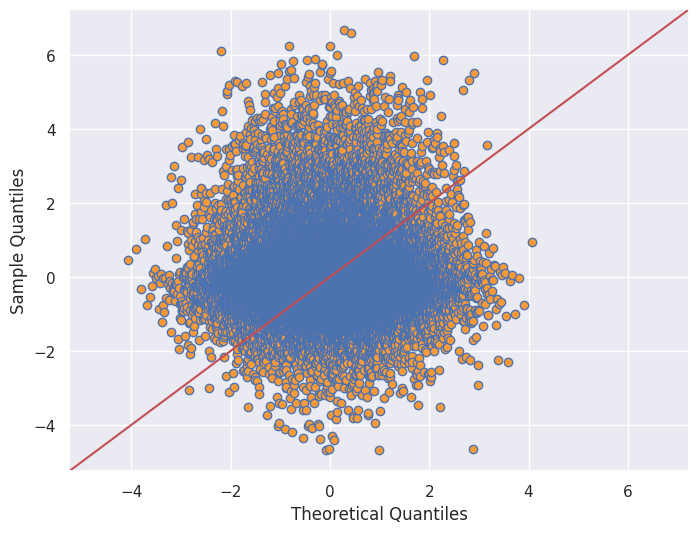

In [169]:
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

# Standardize residuals
residual_ndarray = residual.values.reshape(-1, 1)
std_resid = StandardScaler().fit_transform(residual_ndarray)

# Create QQ plot
fig, ax = plt.subplots(figsize=(8, 6))
sm.qqplot(std_resid, line='45', ax=ax)

# Set scatter color to '#fd9a37'
ax.get_lines()[0].set_markerfacecolor('#fd9a37')

# Show the plot
plt.show()

The QQ Plot does not meet the assumptions.